# Auxtel Spectra analysis : spectra and atmospheric parameters with PTC

- Author : Sylvie Dagoret-Campagne
- creation date : 2024-01-07
- last update : 2024-01-07
- affiliation : IJCLab/IN2P3/CNRS

After a notebook from Jeremy Neveu

## Imports

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

from spectractor.tools import from_lambda_to_colormap, wavelength_to_rgb
%matplotlib widget 

import matplotlib.gridspec as gridspec


In [2]:
plt.rcParams["figure.figsize"] = (8,8)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'
plt.rcParams['legend.fontsize']=  12
plt.rcParams['font.size'] = 12

In [3]:
#from lsst.summit.utils.utils import checkStackSetup
#checkStackSetup()

In [4]:
import lsst.daf.butler as dafButler

repo = "/repo/main"
repo = "/repo/embargo"
# repo = "LATISS"
butler = dafButler.Butler(repo)
registry = butler.registry

for c in sorted(registry.queryCollections()):
    #if "u/jneveu" in c and "auxtel_atmo" in c:
    #if "u/dagoret" in c:
    if "u/dagoret" in c and "auxtel_atmo" in c:
        print(c)

u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208/20231220T142452Z
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221/20231221T125249Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208/20231208T215202Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208/20231208T211104Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T100936Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T130352Z


In [5]:
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208"
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208"

# all spectra from September 2022 to december 2023
#the reconstruction done by  LambdaMin = 350.0 and spectractor v3.0.3 in 2023/12/21
my_collection = "u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221"

## Check the presence of the spectra

### select the date of observation

In [6]:
DATEOBS = 20230802

In [7]:
where = f"instrument='LATISS' and visit.day_obs={DATEOBS}" 
#where = "instrument='LATISS' "
records = list(butler.registry.queryDimensionRecords('visit', datasets='spectractorSpectrum', where=where,  collections=my_collection))
# records = list(butler.registry.queryDimensionRecords('visit', datasets='raw', where=where))

In [8]:
print(">>> Number of records : ",len(records))
records[-1]

>>> Number of records :  43


visit.RecordClass(instrument='LATISS', id=2023080200604, physical_filter='empty~holo4_003', name='AT_O_20230802_000604', day_obs=20230802, seq_num=604, exposure_time=30.0, target_name='HD14943', observation_reason='generic', science_program='spec', azimuth=136.03380973654401, zenith_angle=64.98242017468188, region=ConvexPolygon([UnitVector3d(0.5100879417503016, 0.36584746856090405, -0.7784381294801271), UnitVector3d(0.5093286012637872, 0.36778397731579776, -0.7780227001601218), UnitVector3d(0.510960793702244, 0.3681564004191616, -0.7767753421225334), UnitVector3d(0.5117201341092127, 0.36621989163283486, -0.777190771509598)]), timespan=Timespan(begin=astropy.time.Time('2023-08-03 04:34:33.836012', scale='tai', format='iso'), end=astropy.time.Time('2023-08-03 04:35:04.070000', scale='tai', format='iso')))

### List first of first records

In [9]:
first_seqnum = []

for i, r in enumerate(records):

    print(f"============= ({i}) ============datasetType = spectraction ============================================")
    print("fullId..................:",r.id)
    print("day_obs..................:",r.day_obs)
    print("target..................:",r.target_name)
    print("filt+disp..................:",r.physical_filter)
    seqnum = r.id-r.day_obs*100000
    print("seqnum ....................:",seqnum)
    first_seqnum.append(seqnum)

    # spec = butler.get('spectractorSpectrum', visit=r.id, detector=0, collections=my_collection, instrument='LATISS')
    
    if i>5:
        break

============= (0) ============datasetType = spectraction ============================================
fullId..................: 2023080200279
day_obs..................: 20230802
target..................: HD146233
filt+disp..................: empty~holo4_003
seqnum ....................: 279
============= (1) ============datasetType = spectraction ============================================
fullId..................: 2023080200280
day_obs..................: 20230802
target..................: HD146233
filt+disp..................: empty~holo4_003
seqnum ....................: 280
============= (2) ============datasetType = spectraction ============================================
fullId..................: 2023080200283
day_obs..................: 20230802
target..................: HD146233
filt+disp..................: empty~holo4_003
seqnum ....................: 283
============= (3) ============datasetType = spectraction ============================================
fullId..................:

In [10]:
# delete a collection
# butler.pruneDatasets(datasetRefs, disassociate=True, unstore=True, purge=True)

## Load one spectrum

In [11]:
sel_seqnum = first_seqnum[-3] 

In [12]:
dataId = {"day_obs": DATEOBS, "seq_num": sel_seqnum, 'instrument':'LATISS',"detector": 0}
spec= butler.get('spectractorSpectrum',dataId,collections=my_collection)
p = butler.get('spectrumLibradtranFitParameters',dataId,collections=my_collection)
p

************ getObsAtmo imported ************* 
/home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> _getPackageDir /home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> getObsSiteDataFrame      altitude   pressure
LSST    2.663  731.50433
CTIO    2.207   774.6052
OHP      0.65  937.22595
PDM    2.8905  710.90637
OMK     4.205  600.17224
OSL       0.0     1013.0


FitParameters(values=array([1.17591290e+00, 0.00000000e+00, 1.00000000e-01, 1.74581406e-01,
       3.36268243e+02, 2.27375566e+00, 2.30342378e+00, 1.86902238e+02,
       1.13164277e+00, 0.00000000e+00]), labels=['A1', 'A2', 'VAOD', 'angstrom_exp', 'ozone [db]', 'PWV [mm]', 'reso [pix]', 'D_CCD [mm]', 'alpha_pix [pix]', 'B'], axis_names=['$A_1$', '$A_2$', 'VAOD', '$\\"a$', 'ozone [db]', 'PWV [mm]', 'reso [pix]', '$D_{CCD}$ [mm]', '$\\alpha_{\\mathrm{pix}}$ [pix]', '$B$'], bounds=[[0, 2], [0, 20.0], [0, 0.1], [0, 3], [0.0, 600.0], [0.0, 10.0], [0.1, 10], [185.16186740978125, 189.16186740978125], [-2, 2], [-inf, inf]], fixed=[False, True, True, False, False, False, False, False, True, True], truth=None, filename='', extra=None)

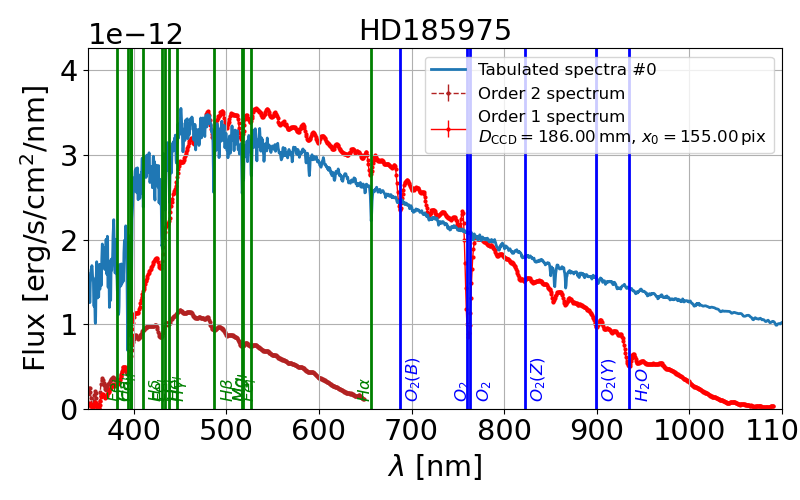

In [13]:
fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot()
_ = spec.plot_spectrum(force_lines=True,ax=ax)

## Load all 1D spectrum and fitted atmospheric parameters

Three kind of informations:
 - 1D Spectrum : ``spectractorSpectrum``
 - atmospheric parameters fitted on 1D spectrum ``spectrumLibradtranFitParameters``
 - atmospheric parameters fitted on Spectrogram ``spectrogramLibradtranFitParameters``

In [14]:
params_spectrum = []
params_spectrogram = []
times = []
headers = []
spectra = []

for i, r in enumerate(records):
    try:
        times.append(r.day_obs)
        spec =  butler.get('spectractorSpectrum', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
        headers.append(spec.header)
        spectra.append(spec)
        p = butler.get('spectrumLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
        params_spectrum.append(p)
        p = butler.get('spectrogramLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
        params_spectrogram.append(p)
    #except ValueError:
    except Exception as inst:
        except_type = type(inst)
        except_args = inst.args
        print("catch exception ", inst, "type =",except_type, "args = ",except_args) 
        print("\t >>>>> Skip record ", r.id)
        continue

In [15]:
len(params_spectrogram)

43

In [16]:
#params_spectrogram

## Filtering data

In [17]:
def select_files(collection, where):
    """
    Select all records according the where clause
    """
    # datasetRefs = registry.queryDatasets(datasetType='spectractorSpectrum', collections=my_collection, where=where)
    #records = list(butler.registry.queryDimensionRecords('exposure', where=where))
    records = list(butler.registry.queryDimensionRecords('exposure', datasets='spectractorSpectrum', where=where,  collections=collection))
    records = sorted(records, key=lambda x: x.id, reverse=False)
    return records

def filter_data(records, sigma_clip=3):  # pragma: no cover
    """
    Spectrum reconstruction Quality Selection
    """
    from scipy.stats import median_abs_deviation
    D = []
    chi2 = []
    dx = []
    amplitude = []
    regs = []
    times = []
    specs = []
    alpha_0_2 = []
    #parameters.VERBOSE = False
    #parameters.DEBUG = False
    for i, r in enumerate(records):
        times.append(r.day_obs)
        spec = butler.get('spectractorSpectrum', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
        spec.dataId = r.id
        if spec.x0[0] > 500: 
            continue
        D.append(spec.header["D2CCD"])
        dx.append(spec.header["PIXSHIFT"])
        regs.append(np.log10(spec.header["PSF_REG"]))
        amplitude.append(np.sum(np.abs(spec.data[300:])))
        # if "CHI2_FIT" in header:
        chi2.append(spec.header["CHI2_FIT"])
        specs.append(spec)
        p = butler.get('spectrumForwardModelFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
        alpha_0_2.append(p.values[p.get_index("alpha_0_2")])
        #except:
        #    new_file_names.remove(name)
        #    print(f"fail to open {name}. len(file_names)={len(new_file_names)}")
    params = {'D2CCD': np.array(D),
              'dx': np.array(dx),
              'regs': np.array(regs),
              'chi2': np.array(chi2),
              'amplitude': np.array(amplitude),
              'alpha_0_2': np.array(alpha_0_2)
             }
    k = np.arange(len(D))
    filter_indices = np.ones_like(k, dtype=bool)
    for par in params.keys():
        if par in ['amplitude']: #, 'alpha_0_2']:
            continue
        filter_indices *= np.logical_and(params[par] > np.median(params[par]) - sigma_clip * median_abs_deviation(params[par]),
                                         params[par] < np.median(params[par]) + sigma_clip * median_abs_deviation(params[par]))
    for par in params.keys():
        fig = plt.figure(figsize=(8,4))
        plt.plot(k, params[par])
        plt.plot(k[filter_indices], params[par][filter_indices], "ko")
        plt.grid()
        plt.title(par)

        suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
        plt.suptitle(suptitle,fontsize=10,y=1.00)
        plt.show()
    return [s for i,s in enumerate(specs) if filter_indices[i]]


def plot_spectra(spectra, colorparams):
    """
    plot spectra
    """

    import matplotlib.colors as mcolors
    import matplotlib.cm as cm
    colormap = cm.Reds
    #colormap = cm.jet 

    normalize = mcolors.Normalize(vmin=np.min(colorparams), vmax=np.max(colorparams))

    all_target_names = [] 

    fig  = plt.figure(figsize=(11,6))
    for spec in spectra:
        target_name = spec.target.label
        if target_name in all_target_names:
            plt.plot(spec.lambdas, spec.data, color = colormap(normalize(spec.airmass)))
        else:
            plt.plot(spec.lambdas, spec.data, color = colormap(normalize(spec.airmass)),label=target_name)
            all_target_names.append(target_name)
            
    plt.grid()
    plt.xlabel("$\lambda$ [nm]")
    plt.ylabel(f"Flux [{spec.units}]")
    plt.legend()
    
    # Colorbar setup
    s_map = cm.ScalarMappable(norm=normalize, cmap=colormap)
    s_map.set_array(colorparams)

    # If color parameters is a linspace, we can set boundaries in this way
    halfdist = (colorparams[1] - colorparams[0])/2.0
    boundaries = np.linspace(colorparams[0] - halfdist, colorparams[-1] + halfdist, len(colorparams) + 1)

    # Use this to emphasize the discrete color values
    cbar = fig.colorbar(s_map) #, spacing='proportional', ticks=colorparams, boundaries=boundaries, format='%2.2g') # format='%2i' for integer

    # Use this to show a continuous colorbar
    #cbar = fig.colorbar(s_map, spacing='proportional', ticks=colorparams, format='%2i')
    cbar.set_label("Airmass $z$")
    title = f"Observations : {DATEOBS}"
    suptitle = f"collection = {my_collection}"
    plt.title(title)
    plt.suptitle(suptitle,fontsize=10)
    plt.show()
    return fig



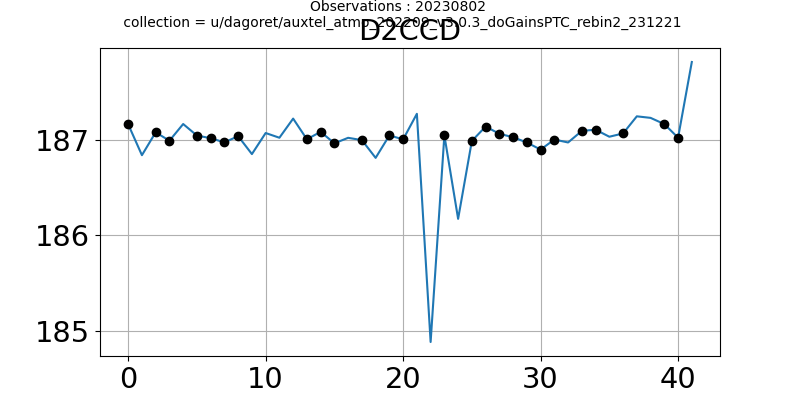

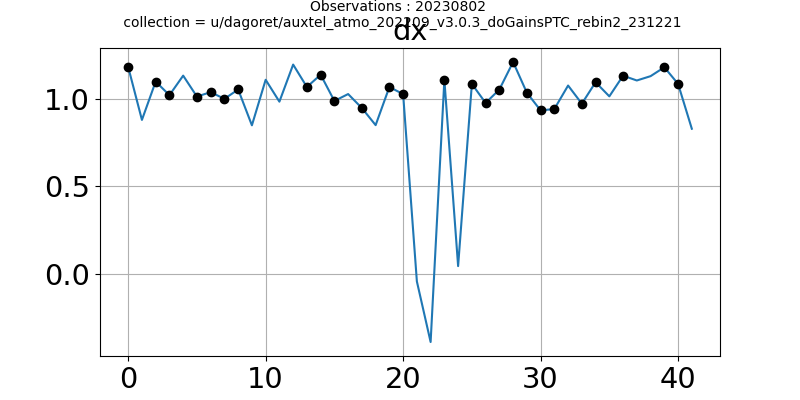

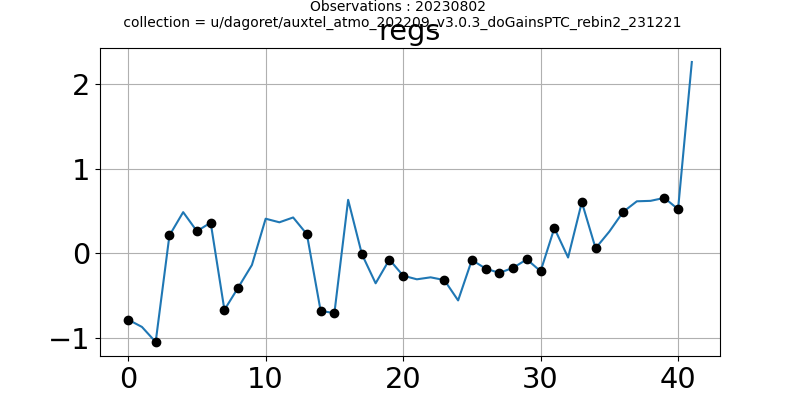

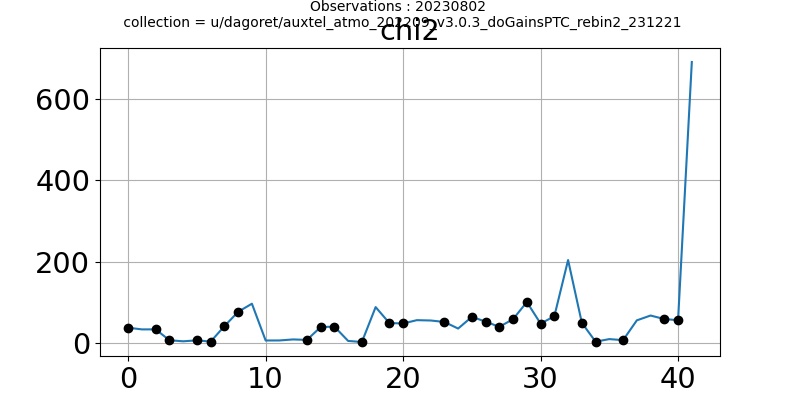

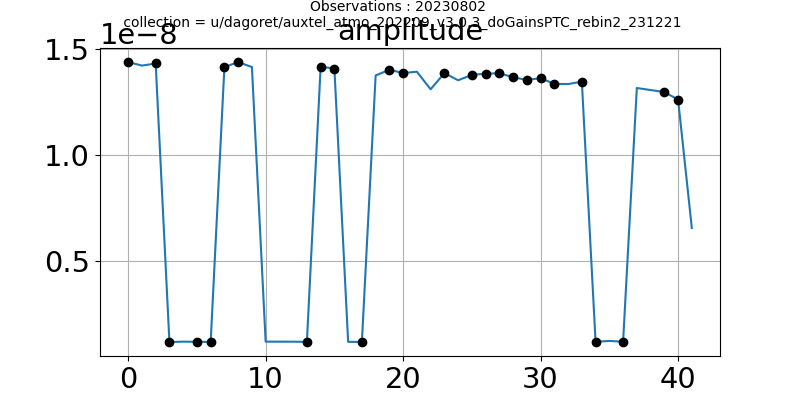

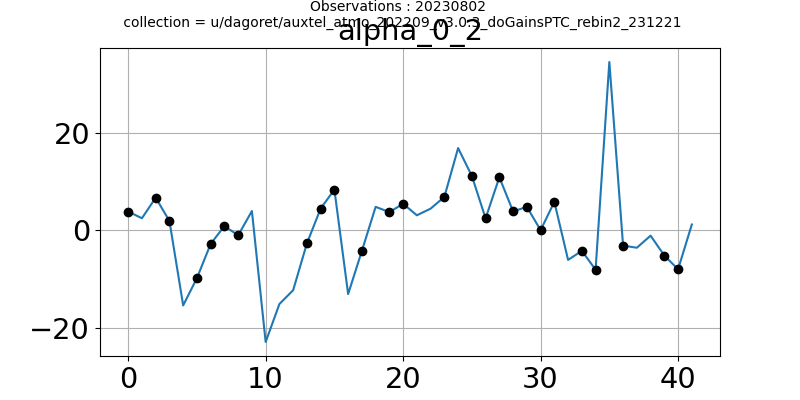

In [18]:
spectra_filtered = filter_data(records)

/tmp/ipykernel_27895/2290022125.py:108: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = fig.colorbar(s_map) #, spacing='proportional', ticks=colorparams, boundaries=boundaries, format='%2.2g') # format='%2i' for integer


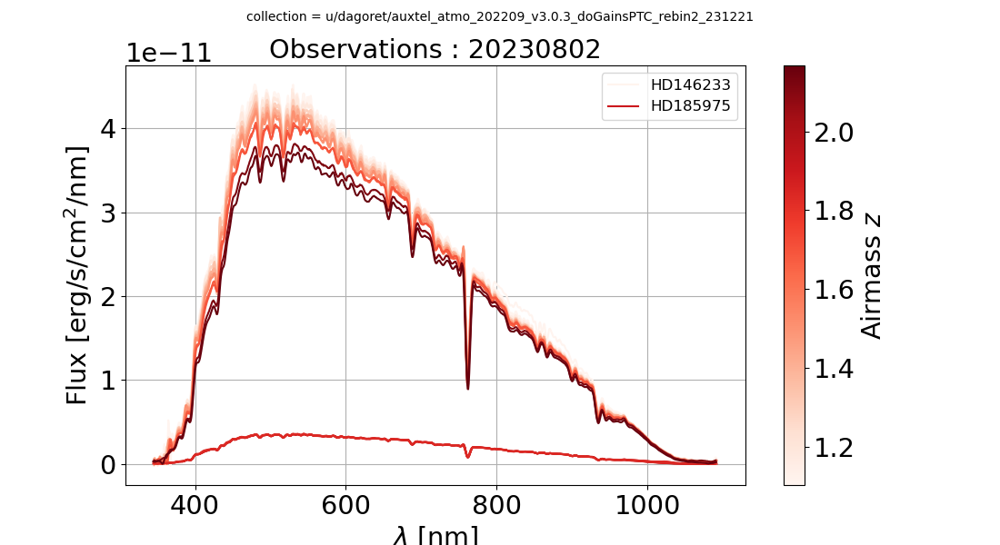

In [19]:
fig = plot_spectra(spectra_filtered, [spec.airmass for spec in spectra_filtered])

## Select a particular target

In [20]:
list_of_targets = np.unique([spec.target.label for spec in spectra_filtered])
print(">>> List of targets ",list_of_targets)
target_indexes = np.where(list_of_targets != 'HD185975')[0]
if len(target_indexes)!=0:
    selected_target = list_of_targets[target_indexes[0]]
elif 'HD185975' in list_of_targets:
    selected_target = 'HD185975'
print(">>> Selected target ",  selected_target)

>>> List of targets  ['HD146233' 'HD185975']
>>> Selected target  HD146233


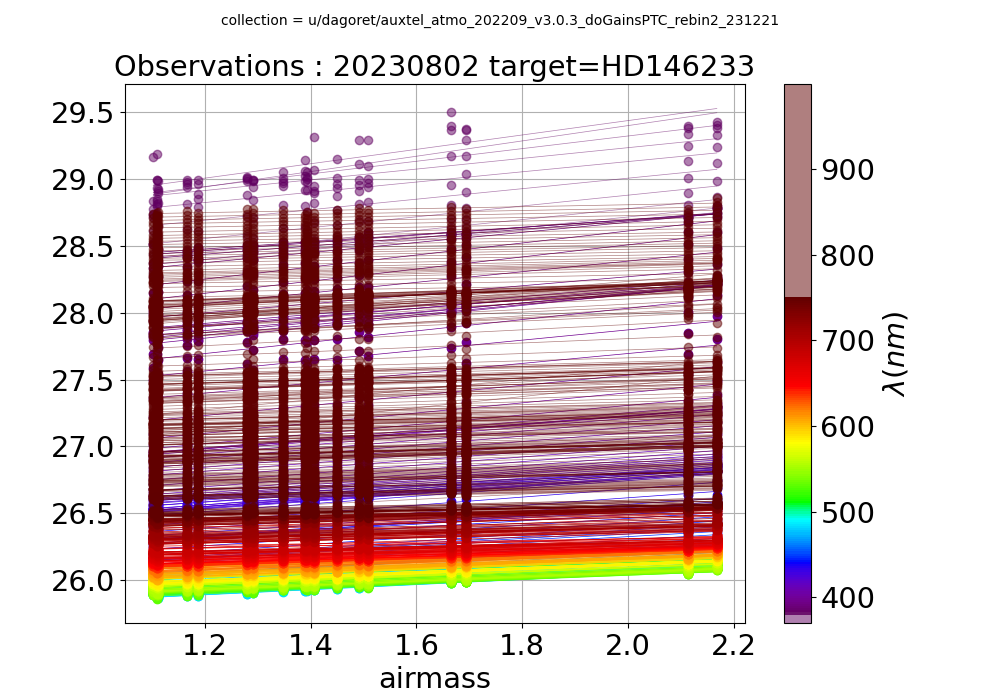

In [21]:
target_label =  selected_target
wls = np.arange(370, 1000, 1)
cmap = from_lambda_to_colormap(wls)
cNorm = mpl.colors.Normalize(vmin=wls.min(), vmax=wls.max())

pvals = []

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
for wl in wls:
    zs = [spec.airmass for spec in spectra_filtered if spec.target.label == target_label]
    mag = -2.5*np.log10([np.interp(wl, spec.lambdas, spec.data) for spec in spectra_filtered if spec.target.label == target_label])
    regr = np.polyfit(zs, mag, deg=1)
    pvals.append(regr)
    p=ax.plot(zs, mag, 'o', label=wl, color=wavelength_to_rgb(wl))
    ax.plot(zs, np.polyval(regr, zs), color=p[0].get_color(),lw=0.5)
ax.grid()
cbar=fig.colorbar(mpl.cm.ScalarMappable(norm=cNorm, cmap=cmap), ax=ax)
cbar.ax.set_ylabel('$\\lambda (nm)$')
ax.set_xlabel("airmass")
title = f"Observations : {DATEOBS} target={target_label}"
suptitle = f"collection = {my_collection}"
plt.title(title)
plt.suptitle(suptitle,fontsize=10)
#plt.legend()
plt.show()

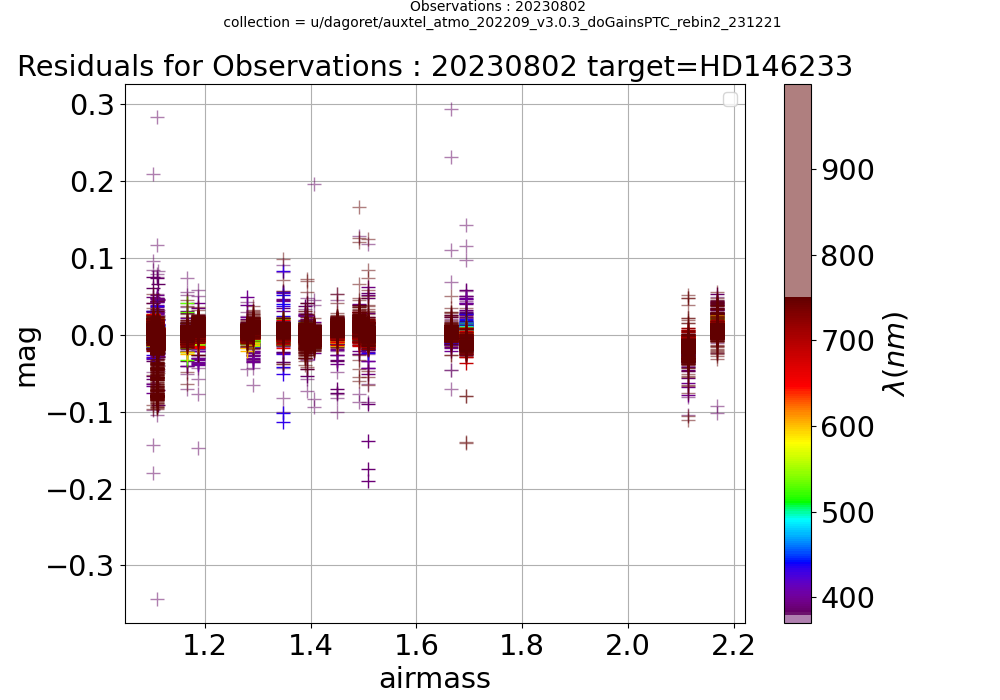

In [22]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
for wl in wls:
    zs = [spec.airmass for spec in spectra_filtered if spec.target.label == target_label]
    mag = -2.5*np.log10([np.interp(wl, spec.lambdas, spec.data) for spec in spectra_filtered if spec.target.label == target_label])
    regr = np.polyfit(zs, mag, deg=1)
    ax.plot(zs, mag - np.polyval(regr, zs), '+', ms=10,lw=3,color=wavelength_to_rgb(wl))
ax.set_xlabel("airmass")
ax.set_ylabel("mag")
ax.grid()
ax.legend()
title = f"Residuals for Observations : {DATEOBS} target={target_label}"
ax.set_title(title)
suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
plt.suptitle(suptitle,fontsize=10,y=1.00)
cbar=fig.colorbar(mpl.cm.ScalarMappable(norm=cNorm, cmap=cmap), ax=ax)
cbar.ax.set_ylabel('$\\lambda (nm)$')
plt.show()

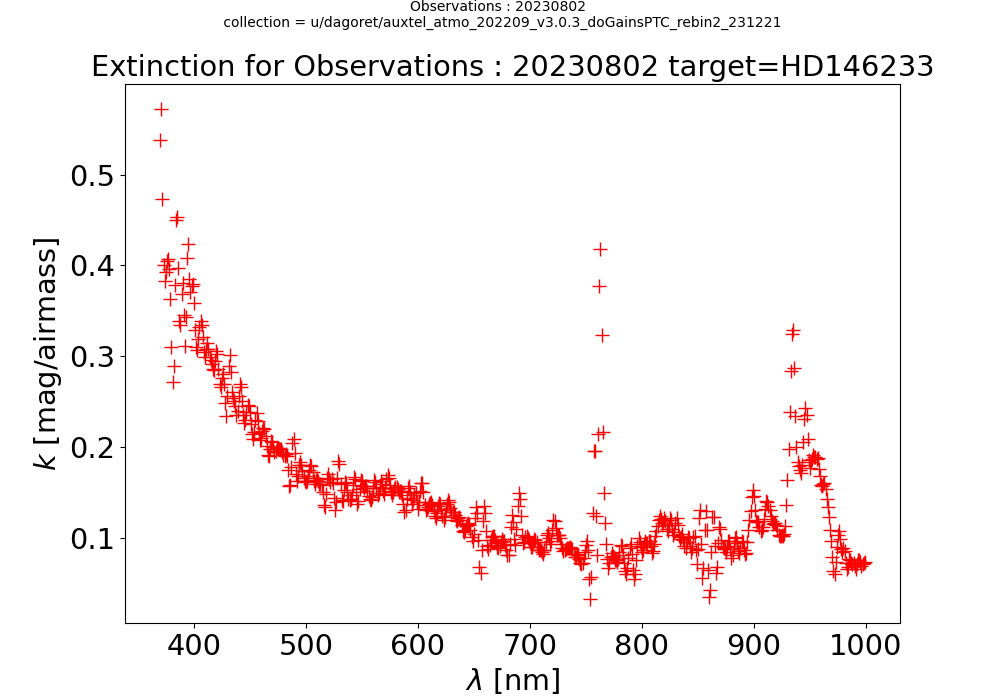

In [23]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
ax.plot(wls, [p[0] for p in pvals], "r+",ms=10,lw=3)
ax.set_xlabel("$\lambda$ [nm]")
ax.set_ylabel("$k$ [mag/airmass]")
title = f"Extinction for Observations : {DATEOBS} target={target_label}"
ax.set_title(title)
suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
plt.suptitle(suptitle,fontsize=10,y=1.00)
plt.show()

In [24]:
import matplotlib
matplotlib.pyplot.close()

In [25]:
columns_spectrum = ["id"]

for h in headers[0]:
    if "COMMENT" in h or "EXTNAME" in h: continue
    if "LBDAS_T" in h or "PSF_P_T" in h or "AMPLIS_T" in h: continue
    if "UNIT" in h: continue
    if "SIMPLE" in h: continue
    columns_spectrum.append(h)
 
columns_spectrogram_bestfit = []
for key in params_spectrogram[0].labels:
    columns_spectrogram_bestfit.append(key)
    columns_spectrogram_bestfit.append(key+"_err")

columns_spectrum_bestfit = []
for key in params_spectrum[0].labels:
    columns_spectrum_bestfit.append(key)
    columns_spectrum_bestfit.append(key+"_err")

In [26]:
min_index = 0
max_index = np.inf

df1 = pd.DataFrame(columns=columns_spectrum)

for k, header in enumerate(headers):
    # if k > 40: break
    n = records[k].id
    if n < min_index or n > max_index: continue
    row = {"id": n}
    for h in header:
        if h in columns_spectrum:
            row[h] = header[h]
    df1.loc[len(df1)] = row
            
df2 = pd.DataFrame(columns=columns_spectrogram_bestfit)

for k, p in enumerate(params_spectrogram):
    n = records[k].id
    if n < min_index or n > max_index: continue
    row = {"id": n}
    for i, key in enumerate(p.labels):
        row[key] = p.values[i]
        row[key+"_err"] = p.err[i]
    df2.loc[len(df2)] = row
            
df3 = pd.DataFrame(columns=columns_spectrum_bestfit)

for k, p in enumerate(params_spectrum):
    n = records[k].id
    if n < min_index or n > max_index: continue
    row = {"id": n}
    for i, key in enumerate(p.labels):
        row[key] = p.values[i]
        row[key+"_err"] = p.err[i]
    df3.loc[len(df3)] = row
            


In [27]:
df3

,A1,A1_err,A2,A2_err,VAOD,VAOD_err,angstrom_exp,angstrom_exp_err,ozone [db],ozone [db]_err,PWV [mm],PWV [mm]_err,reso [pix],reso [pix]_err,D_CCD [mm],D_CCD [mm]_err,alpha_pix [pix],alpha_pix [pix]_err,B,B_err
0,1.107044,0.000871,0.0,0.0,0.100000,0.000000,0.445898,0.021079,297.214009,10.008252,2.054932,0.034176,2.149098,0.040882,186.943330,0.006224,1.181180,0.0,0.0,0.0
1,1.109750,0.000927,0.0,0.0,0.100000,0.000000,0.442502,0.022793,337.626622,10.117365,1.865241,0.032472,2.295329,0.046588,186.492817,0.006644,0.879428,0.0,0.0,0.0
2,1.071387,0.000826,0.0,0.0,0.079793,0.000000,0.594028,0.027493,184.862054,9.974643,2.057532,0.033995,1.988391,0.042870,186.933044,0.005230,1.097847,0.0,0.0,0.0
3,1.180027,0.001007,0.0,0.0,0.100000,0.000000,0.000000,0.010801,324.926205,6.127682,2.476385,0.028782,2.099265,0.036472,186.912508,0.005876,1.020314,0.0,0.0,0.0
4,1.175913,0.000995,0.0,0.0,0.100000,0.000000,0.174581,0.011756,336.268243,6.109379,2.273756,0.029884,2.303424,0.047990,186.902238,0.007000,1.131643,0.0,0.0,0.0
5,1.176990,0.001025,0.0,0.0,0.100000,0.000000,0.062231,0.011587,342.388643,6.137587,2.204972,0.027517,1.872805,0.029326,186.997496,0.005085,1.012320,0.0,0.0,0.0
6,0.957983,0.001025,0.0,0.0,0.000000,0.000698,2.237692,0.000000,227.035946,5.988092,2.329830,0.028409,1.994834,0.029738,186.908036,0.005919,1.037619,0.0,0.0,0.0
7,1.095365,0.000896,0.0,0.0,0.100000,0.000000,0.404830,0.022204,307.654736,10.193305,2.243648,0.034424,2.689596,0.051786,186.812839,0.007248,0.999384,0.0,0.0,0.0
8,1.133961,0.176316,0.0,0.0,0.100000,0.141076,0.398024,0.603241,392.249384,17.028152,4.835950,0.160978,1.045494,0.022953,187.028808,0.005193,1.052714,0.0,0.0,0.0
9,1.104960,0.000962,0.0,0.0,0.100000,0.000000,0.911643,0.031247,515.335815,10.312094,1.970417,0.035381,2.741477,0.059466,186.525212,0.008509,0.848618,0.0,0.0,0.0


In [28]:
df = pd.merge(df1, df2, left_index=True, right_index=True)
df = pd.merge(df, df3, left_index=True, right_index=True)
df.set_index('DATE-OBS', inplace=True)
#df.index = pd.to_datetime(df.index, format="ISO8601") #['DATE-OBS'])
df.index = pd.to_datetime(df.index) #['DATE-OBS'])
df.sort_index(inplace=True)
df

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-08-02 23:14:19.251990723+00:00,2023080200279,-64,2,1067,3,True,HD146233,0.000039,holo4_003,0.176600,...,2.054932,0.034176,2.149098,0.040882,186.943330,0.006224,1.181180,0.0,0.0,0.0
2023-08-02 23:15:02.255509377+00:00,2023080200280,-64,2,1066,3,True,HD146233,0.000039,holo4_003,0.175777,...,1.865241,0.032472,2.295329,0.046588,186.492817,0.006644,0.879428,0.0,0.0,0.0
2023-08-02 23:16:48.498007604+00:00,2023080200283,-64,2,1067,3,True,HD146233,0.000039,holo4_003,0.173328,...,2.057532,0.033995,1.988391,0.042870,186.933044,0.005230,1.097847,0.0,0.0,0.0
2023-08-03 00:45:37.903003734+00:00,2023080200322,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.111527,...,2.476385,0.028782,2.099265,0.036472,186.912508,0.005876,1.020314,0.0,0.0,0.0
2023-08-03 00:46:20.994494574+00:00,2023080200323,-64,2,1066,3,True,HD185975,-0.000065,holo4_003,0.108881,...,2.273756,0.029884,2.303424,0.047990,186.902238,0.007000,1.131643,0.0,0.0,0.0
2023-08-03 00:48:12.865007321+00:00,2023080200326,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.111915,...,2.204972,0.027517,1.872805,0.029326,186.997496,0.005085,1.012320,0.0,0.0,0.0
2023-08-03 00:48:55.877006141+00:00,2023080200327,-64,2,1067,3,True,HD185975,-0.000065,holo4_003,0.109922,...,2.329830,0.028409,1.994834,0.029738,186.908036,0.005919,1.037619,0.0,0.0,0.0
2023-08-03 01:06:31.328502699+00:00,2023080200347,-64,2,1067,3,True,HD146233,0.000039,holo4_003,0.174565,...,2.243648,0.034424,2.689596,0.051786,186.812839,0.007248,0.999384,0.0,0.0,0.0
2023-08-03 01:12:51.904498235+00:00,2023080200357,-64,2,1066,3,True,HD146233,0.000039,holo4_003,0.169385,...,4.835950,0.160978,1.045494,0.022953,187.028808,0.005193,1.052714,0.0,0.0,0.0


In [29]:
pd.set_option('display.max_columns', None)
df

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,D2CCD,LSHIFT,PARANGLE,TARGETX,TARGETY,LBDA_REF,PSF_REG,TRACE_R,MEANFWHM,PIXSHIFT,CHI2_FIT,A2_FIT,AM_FIT,VERSION,REBIN,CONFIG,EXPTIME,AIRMASS,DEC,HA,OUTTEMP,OUTPRESS,OUTHUM,FILTER,CAM_ROT,S_X0,S_Y0,S_XMIN,S_XMAX,S_YMIN,S_YMAX,S_NX,S_NY,S_DEG,S_SAT,S_ORDER,A1_x,A1_err_x,A2_x,A2_err_x,A3,A3_err,VAOD_x,VAOD_err_x,angstrom_exp_x,angstrom_exp_err_x,ozone [db]_x,ozone [db]_err_x,PWV [mm]_x,PWV [mm]_err_x,D_CCD [mm]_x,D_CCD [mm]_err_x,shift_x [pix],shift_x [pix]_err,shift_y [pix],shift_y [pix]_err,angle [deg],angle [deg]_err,B_x,B_err_x,x_c_0_1,x_c_0_1_err,x_c_1_1,x_c_1_1_err,x_c_2_1,x_c_2_1_err,y_c_0_1,y_c_0_1_err,y_c_1_1,y_c_1_1_err,y_c_2_1,y_c_2_1_err,gamma_0_1,gamma_0_1_err,gamma_1_1,gamma_1_1_err,gamma_2_1,gamma_2_1_err,alpha_0_1,alpha_0_1_err,alpha_1_1,alpha_1_1_err,alpha_2_1,alpha_2_1_err,saturation_0_1,saturation_0_1_err,x_c_0_2,x_c_0_2_err,x_c_1_2,x_c_1_2_err,x_c_2_2,x_c_2_2_err,y_c_0_2,y_c_0_2_err,y_c_1_2,y_c_1_2_err,y_c_2_2,y_c_2_2_err,gamma_0_2,gamma_0_2_err,gamma_1_2,gamma_1_2_err,gamma_2_2,gamma_2_2_err,alpha_0_2,alpha_0_2_err,alpha_1_2,alpha_1_2_err,alpha_2_2,alpha_2_2_err,saturation_0_2,saturation_0_2_err,x_c_0_3,x_c_0_3_err,x_c_1_3,x_c_1_3_err,x_c_2_3,x_c_2_3_err,y_c_0_3,y_c_0_3_err,y_c_1_3,y_c_1_3_err,y_c_2_3,y_c_2_3_err,gamma_0_3,gamma_0_3_err,gamma_1_3,gamma_1_3_err,gamma_2_3,gamma_2_3_err,alpha_0_3,alpha_0_3_err,alpha_1_3,alpha_1_3_err,alpha_2_3,alpha_2_3_err,saturation_0_3,saturation_0_3_err,A1_y,A1_err_y,A2_y,A2_err_y,VAOD_y,VAOD_err_y,angstrom_exp_y,angstrom_exp_err_y,ozone [db]_y,ozone [db]_err_y,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-08-02 23:14:19.251990723+00:00,2023080200279,-64,2,1067,3,True,HD146233,0.000039,holo4_003,0.176600,187.158944,0.0,-149.262956,154.802453,863.954687,615.216254,1.631877e-01,56.043528,5.235485,1.181180,38.052682,1.0,1.112149,3.0.2,2,,30.0,1.112149,-8.345703,-15.051409,16.237499,791.24,11.5250,empty,-31.453925,-485.850382,19.954687,637,1704,844,889,1067,45,2,22666.666667,1,1.033457,0.000139,1.0,0.0,1.0,0.0,3.193543e-02,0.000129,2.566122,0.000000,376.787677,1.048600,2.482064,0.005777,186.991433,0.000830,1.181180,0.0,0.0,0.0,0.176600,0.0,1.0,0.0,1020.029427,0.0,533.005795,0.0,-0.003406,0.0,1.008145,0.000391,0.115158,0.000718,0.975571,0.000828,3.846572,0.001201,-1.010955,0.002137,0.405875,0.002821,1.864839,0.000392,-0.149393,0.000702,0.027122,0.000894,22666.666667,0.0,1020.029427,0.0,533.005795,0.0,-0.003406,0.0,10.538966,0.051060,16.523219,0.088919,6.418616,0.041083,-6.628689,0.091984,-18.400935,0.156639,-13.470167,0.068936,-1.202583,0.021476,-4.992299,0.036685,-3.274327,0.016440,22666.666667,0.0,1020.029427,0.0,533.005795,0.0,-0.003406,0.0,-9.738468e+05,1.002103e+05,-1.496442e+06,1.527151e+05,-5.244510e+05,5.258156e+04,4.884328e+07,2.274658e+05,7.490000e+07,3.484179e+05,2.613316e+07,1.212789e+05,4.989448e+07,2.792599e+05,7.651540e+07,4.276490e+05,2.669987e+07,1.487800e+05,22666.666667,0.0,1.107044,0.000871,0.0,0.0,0.100000,0.000000,0.445898,0.021079,297.214009,10.008252,2.054932,0.034176,2.149098,0.040882,186.943330,0.006224,1.181180,0.0,0.0,0.0
2023-08-02 23:15:02.255509377+00:00,2023080200280,-64,2,1066,3,True,HD146233,0.000039,holo4_003,0.175777,186.837026,0.0,-149.550764,155.196292,863.877408,615.216254,1.339869e-01,56.051694,5.013281,0.879428,33.932216,1.0,1.111291,3.0.2,2,,30.0,1.111291,-8.345702,-14.871732,16.275000,791.24,11.5500,empty,-31.454003,-487.489758,19.877408,640,1706,844,889,1066,45,2,22666.666667,1,1.075266,0.001569,1.0,0.0,1.0,0.0,7.054364e-02,0.001321,0.493547,0.011211,296.377910,1.085125,2.056683,0.005949,186.726700,0.000868,0.879428,0.0,0.0,0.0,0.175777,0.0,1.0,0.0,1020.867278,0.0,532.505719,0.0,-0.003345,0.0,0.939795,0.00

In [30]:
rec = df.to_records()

In [31]:
#np.save("auxtel_libradtran_202301_v3.0.3_doGainsPTC.npy", rec)

In [32]:
#rec = np.load("auxtel_libradtran_202301_v3.0.3_doGainsPTC.npy", allow_pickle=True)
#df = pd.DataFrame(rec)

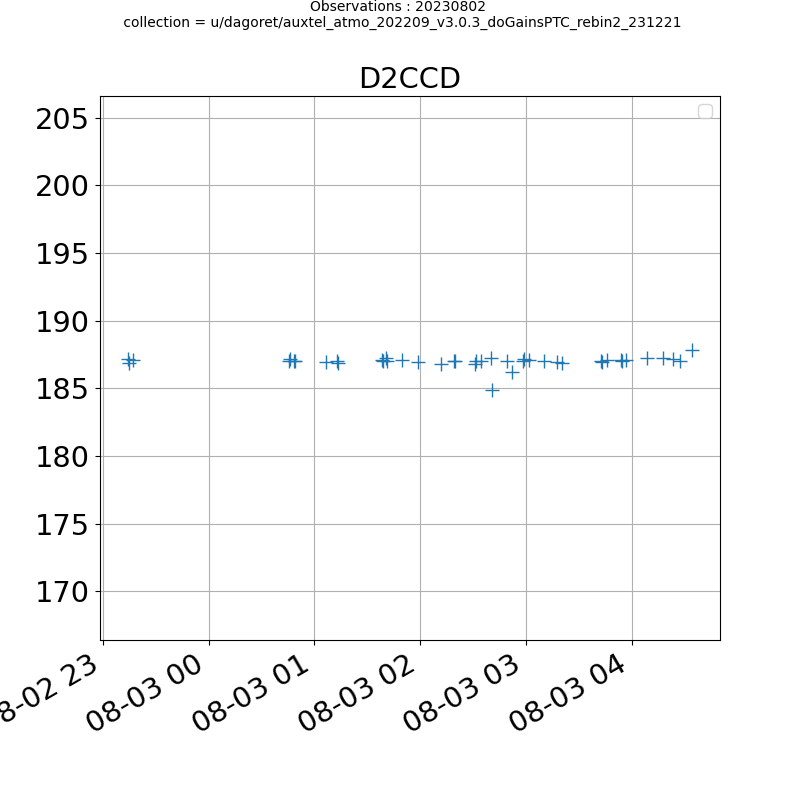

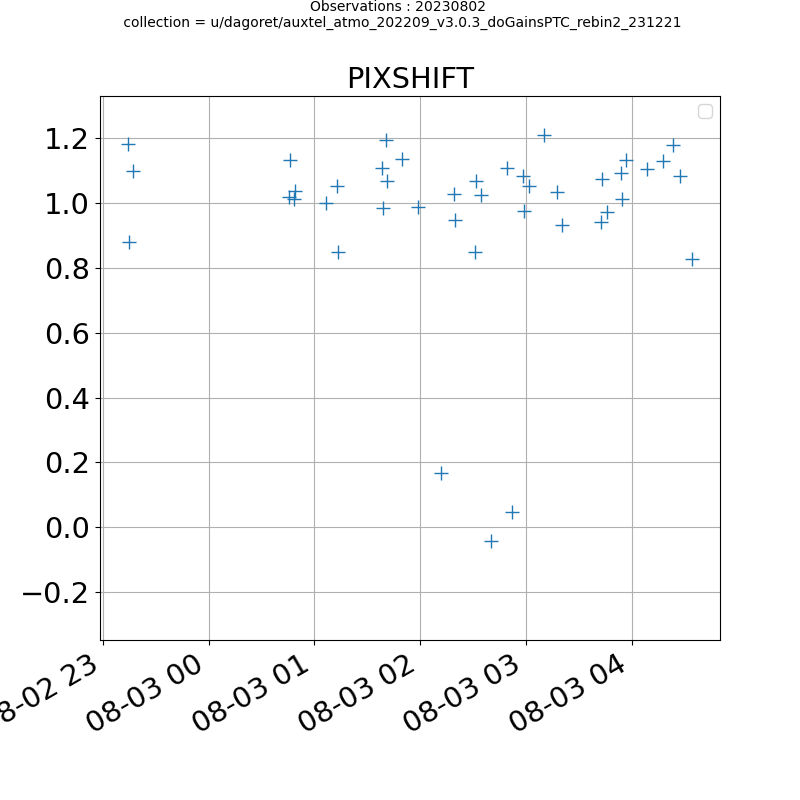

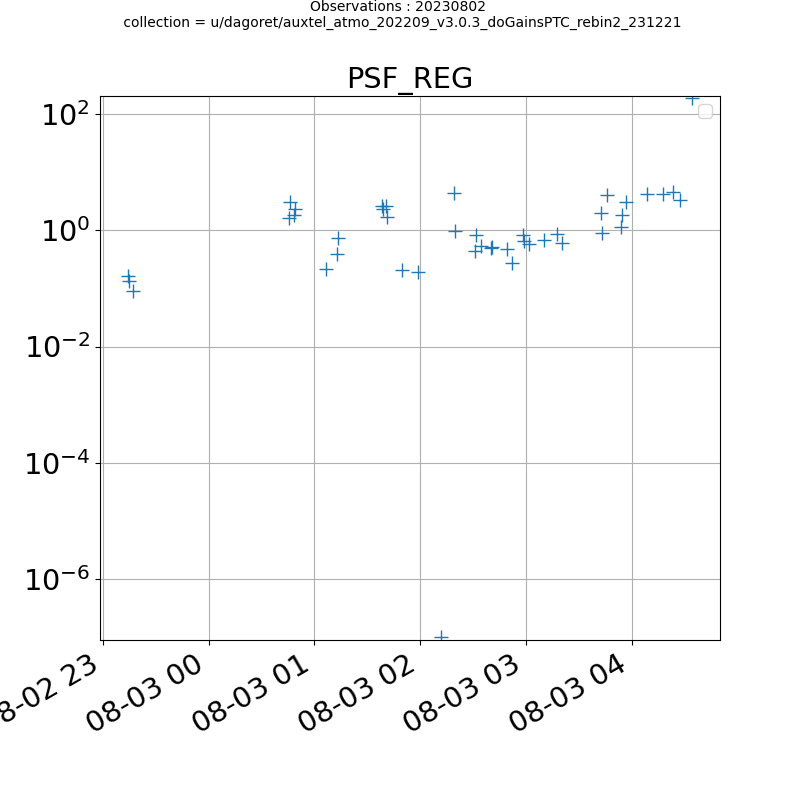

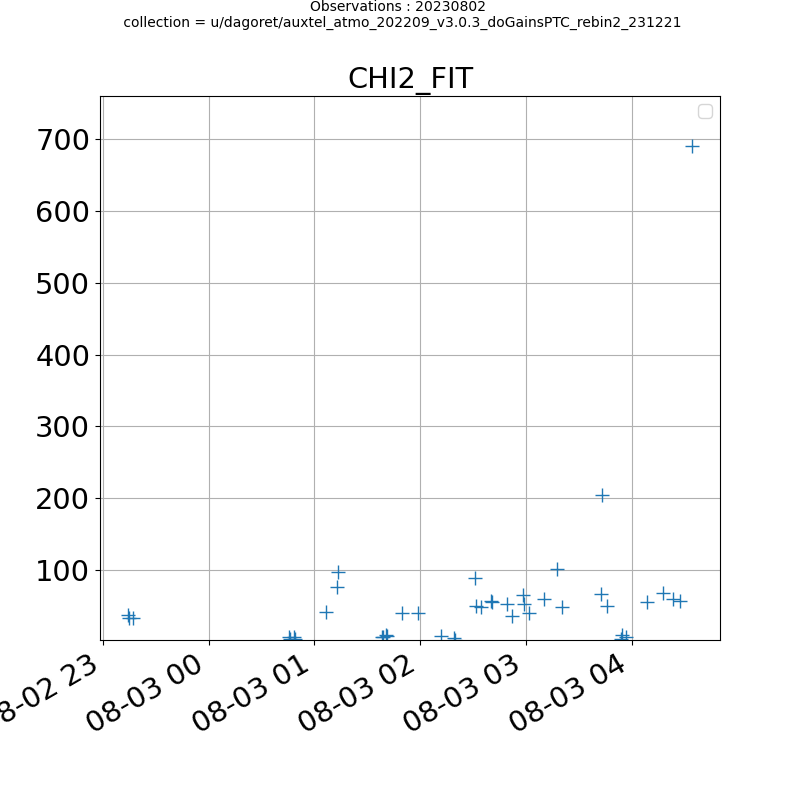

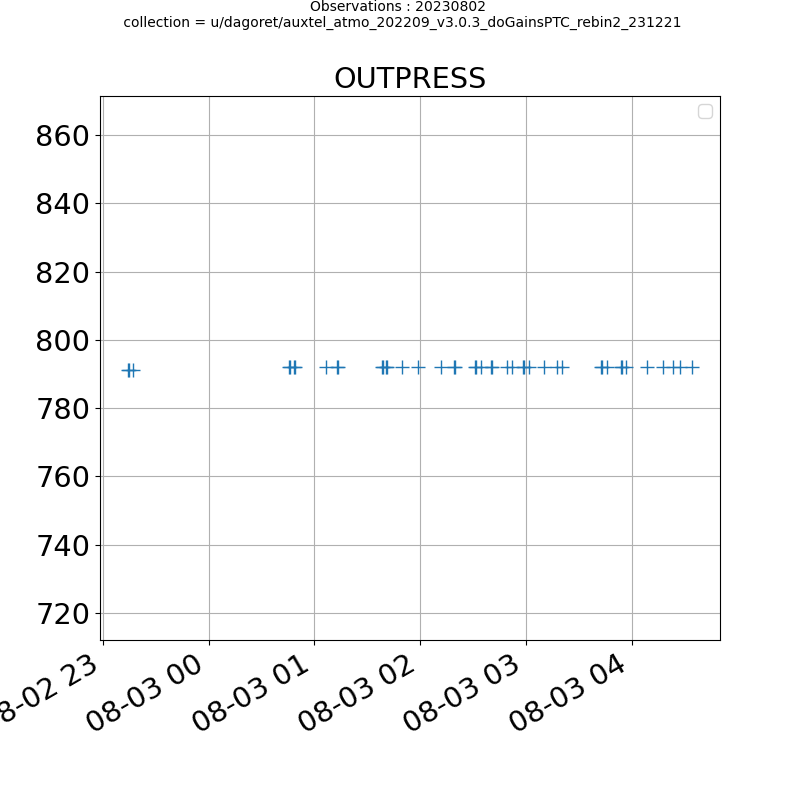

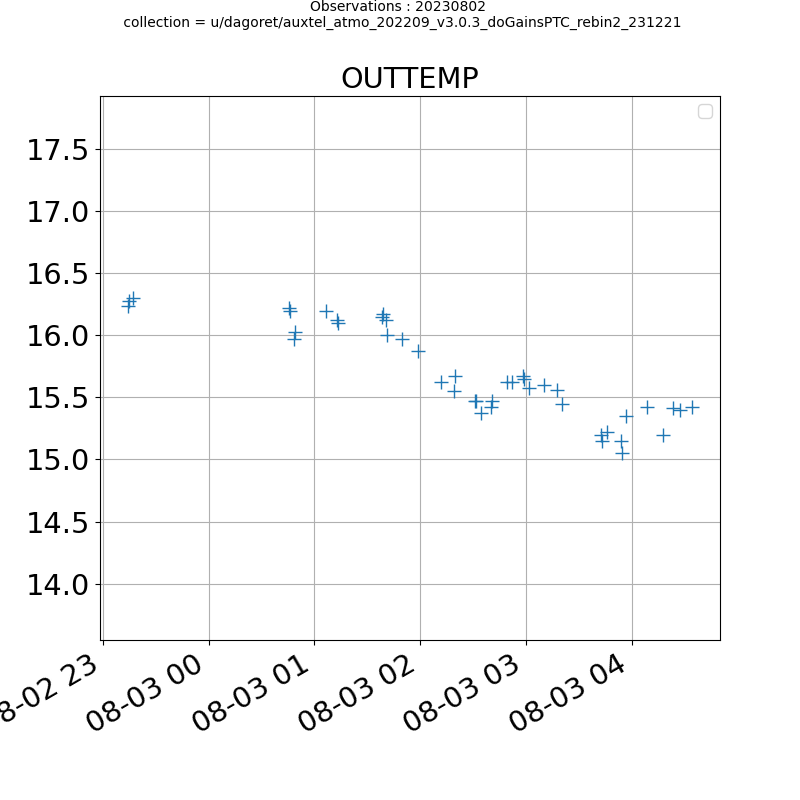

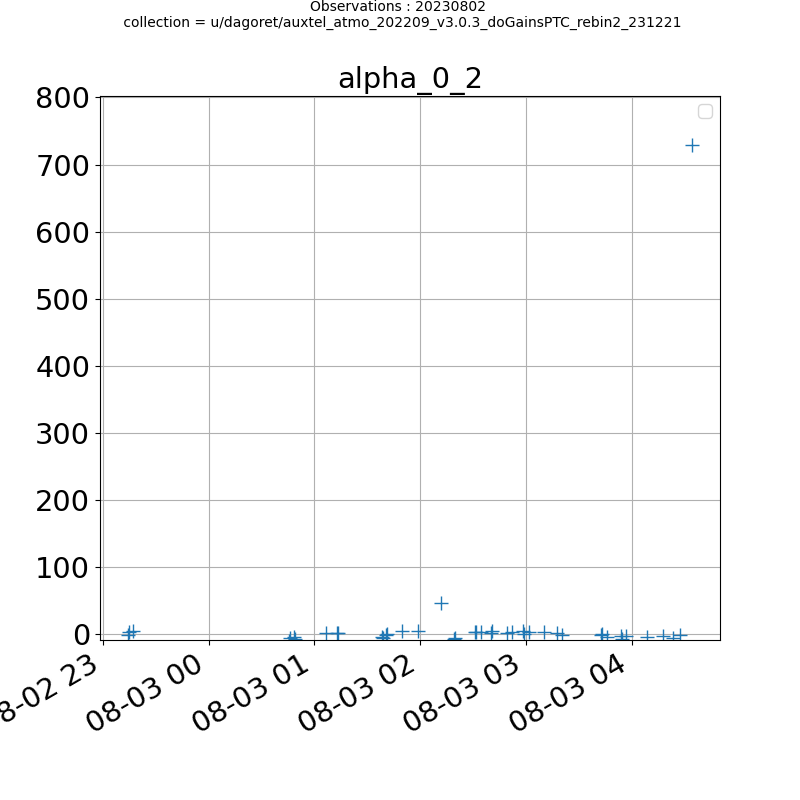

In [33]:
for col in ["D2CCD", "PIXSHIFT", "PSF_REG", "CHI2_FIT", "OUTPRESS", "OUTTEMP", "alpha_0_2"]:
    if col not in df.columns: continue
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure()
    if col_err in df.columns:
        plt.errorbar(rec["DATE-OBS"], rec[col], yerr=rec[col_err], linestyle="none", marker="+")
    else:
        plt.plot(rec["DATE-OBS"], rec[col], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col]), 1.1*np.max(rec[col])))
    if "PSF_REG" in col:
        plt.yscale("log")
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.00)
    plt.show()

In [34]:
filtered = (rec["CHI2_FIT"] < 100) & (rec["PSF_REG"] > 1e-2) & (rec["D2CCD"] > 186)  & (rec["D2CCD"] < 188)  # & (np.abs(rec["PIXSHIFT"]) < 0.5) 
print(np.sum(filtered))
filtered = filtered & (rec["PWV [mm]_err_x"] > 0) & (rec["PWV [mm]_err_x"] < 5) & (rec["A1_err_y"] > 0) & (rec["A1_err_y"] < 5) & (rec["PWV [mm]_err_y"] > 0) & (rec["PWV [mm]_err_y"] < 5)
print(np.sum(filtered))
filtered = filtered & (rec["reso [pix]"] < 3)
print(np.sum(filtered))
filtered = filtered & (rec["ozone [db]_err_y"] > 0) & (rec["ozone [db]_err_y"] < 100)
print(np.sum(filtered))
filtered = filtered & (rec["A1_x"] > 0.1) & (rec["A1_x"] < 1.5)
print(np.sum(filtered))
filtered = filtered & (np.abs(rec["gamma_0_2"]) < 30) & (np.abs(rec["alpha_0_2"]) < 10)
print(np.sum(filtered))

38
36
35
35
35
35


In [35]:
len(filtered)

43

In [36]:
np.sum(filtered)

35

### Spectrum fits

In [37]:
ATMMINMAX = {}
ATMMINMAX["A1_y"] = [0.7,1.3]
ATMMINMAX["chi2_y"] = [0.,500.]
ATMMINMAX["ozone [db]_y"] = [0.,600.]
ATMMINMAX["PWV [mm]_y"] = [0.,10.]
ATMMINMAX["VAOD_y"] = [0.,0.2]
ATMMINMAX["A2_y"] = [0.7,1.3]

ATMMINMAX["A1_x"] = [0.7,1.3]
ATMMINMAX["chi2_x"] = [0.,500.]
ATMMINMAX["ozone [db]_x"] = [0.,600.]
ATMMINMAX["PWV [mm]_x"] = [0.,10.]
ATMMINMAX["VAOD_x"] = [0.,0.2]
ATMMINMAX["A2_x"] = [0.7,1.3]

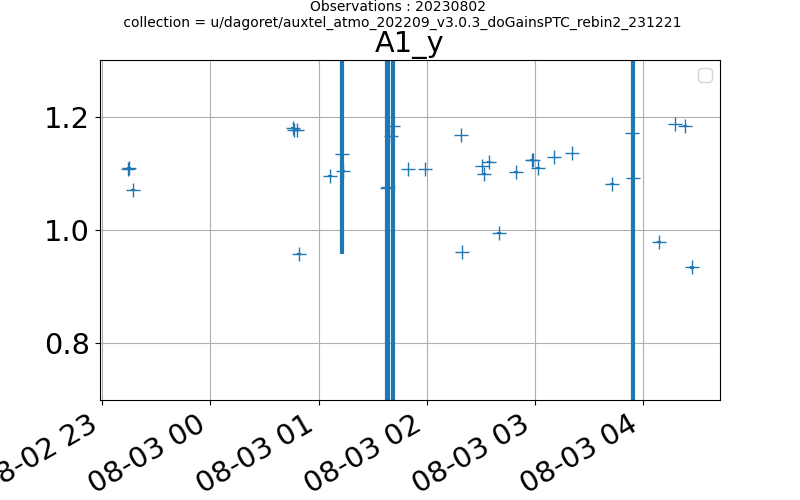

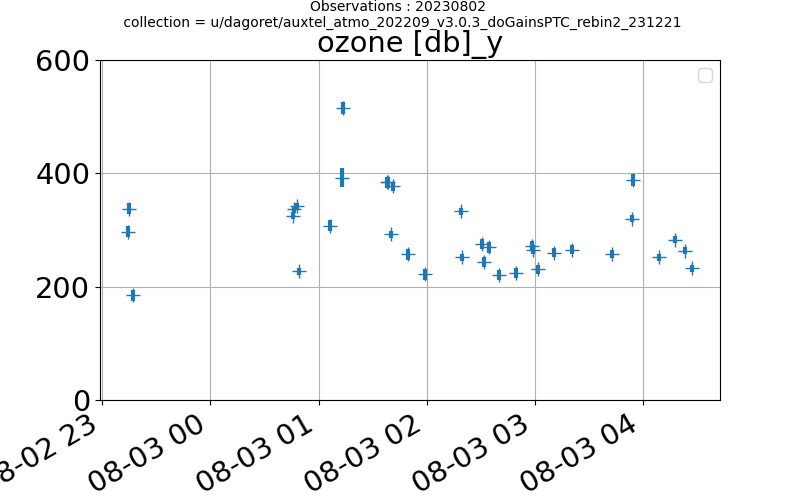

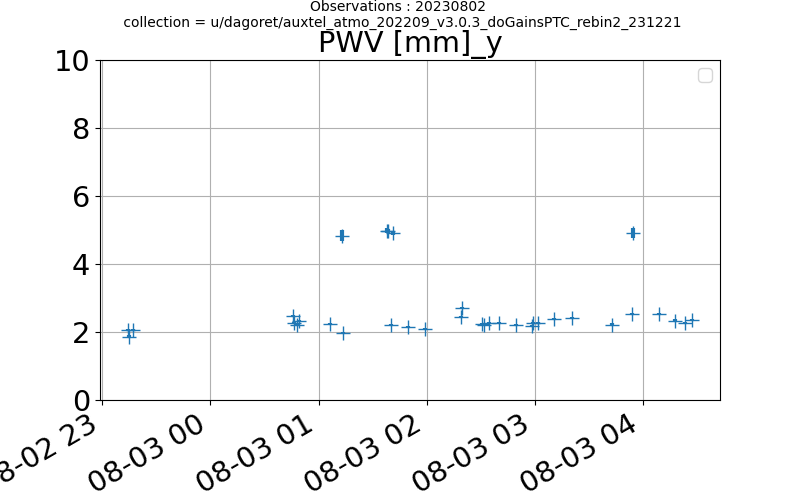

/tmp/ipykernel_27895/929449959.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8,5))


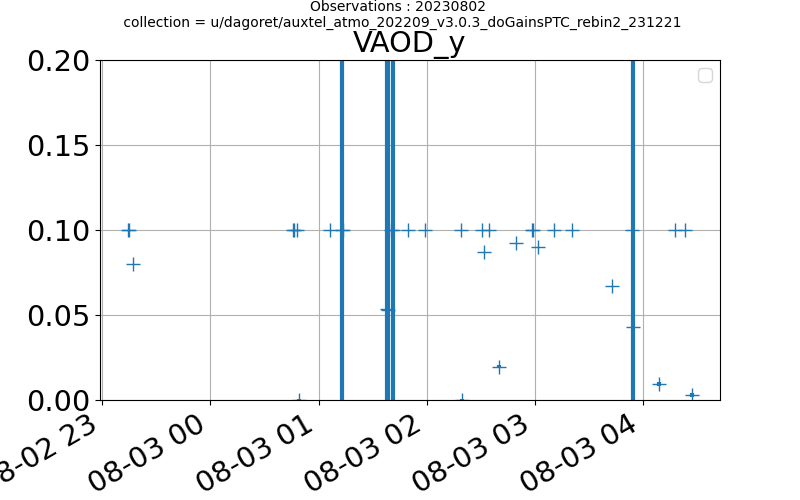

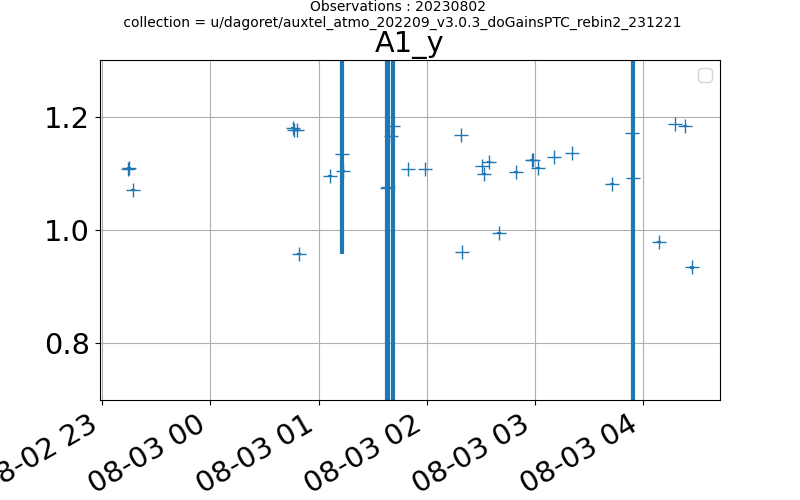

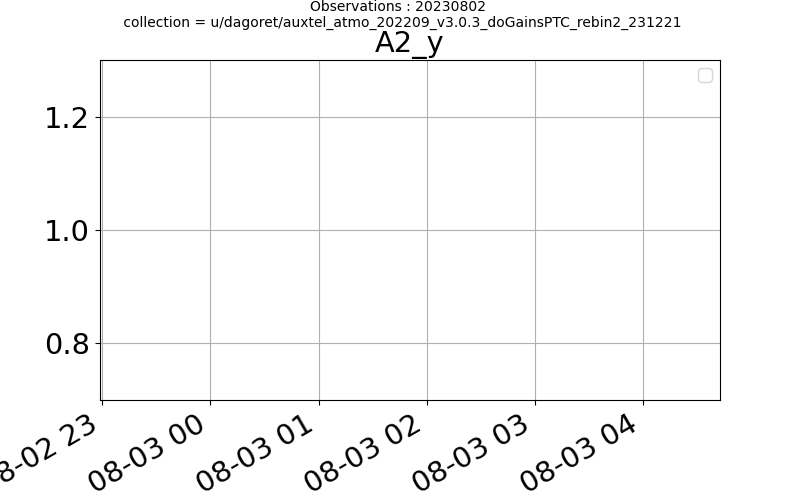

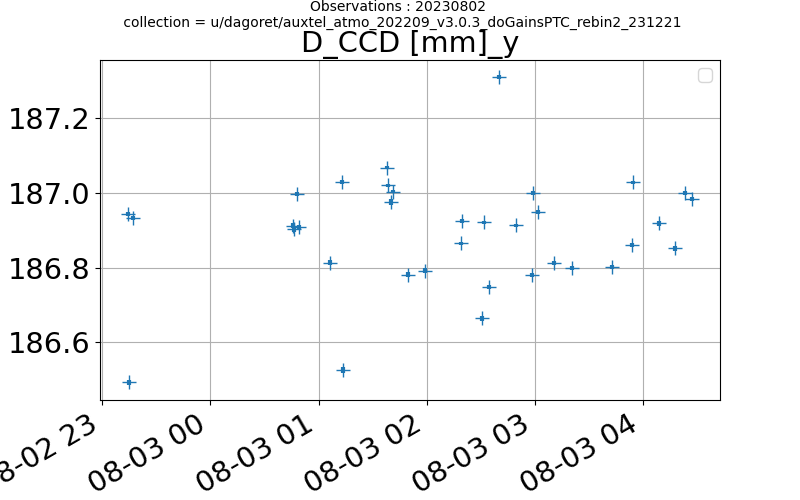

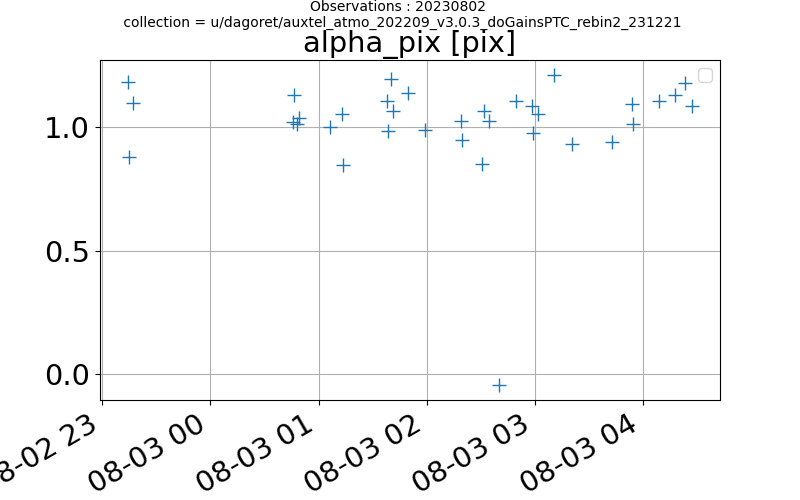

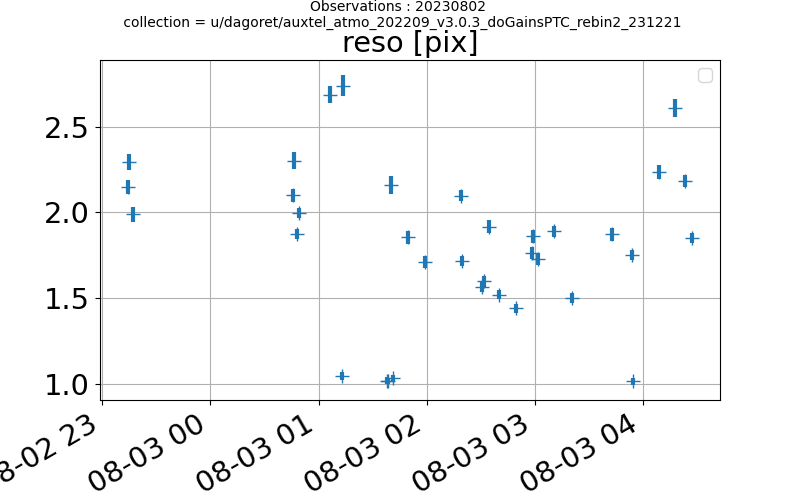

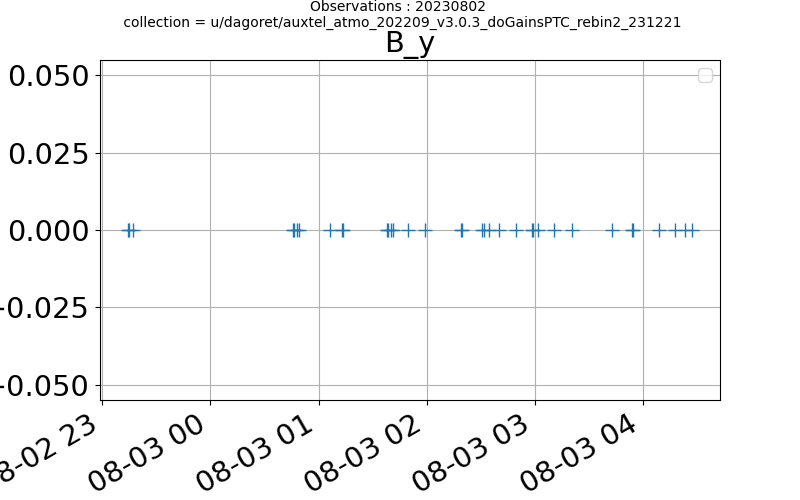

In [38]:
for col in ["A1_y", "chi2_y", "ozone [db]_y", "PWV [mm]_y", "VAOD_y", "A1_y", "A2_y", "D_CCD [mm]_y", "alpha_pix [pix]", "reso [pix]", "B_y"]:
    if col not in df.columns: 
        continue
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    if col_err in df.columns:
        plt.errorbar(rec["DATE-OBS"][filtered], rec[col][filtered], yerr=rec[col_err][filtered], linestyle="none", marker="+",ms=10,lw=3)
    else:
        plt.plot(rec["DATE-OBS"][filtered], rec[col][filtered], linestyle="none", marker="+",ms=10,lw=3)
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    #plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
   

    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.00)
    plt.show()

In [39]:
filters = np.unique(rec["FILTER"])
filters

array(['empty'], dtype=object)

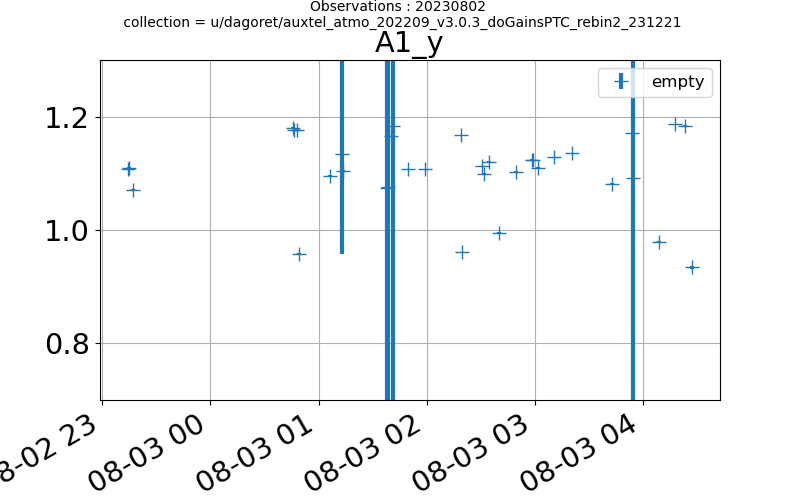

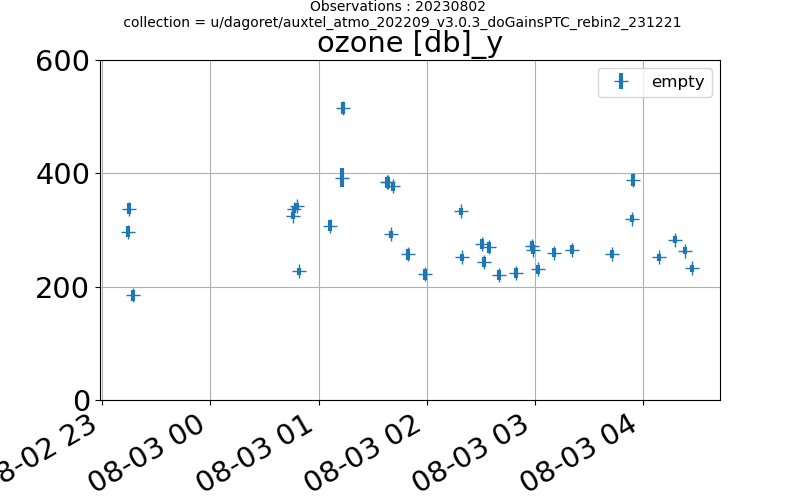

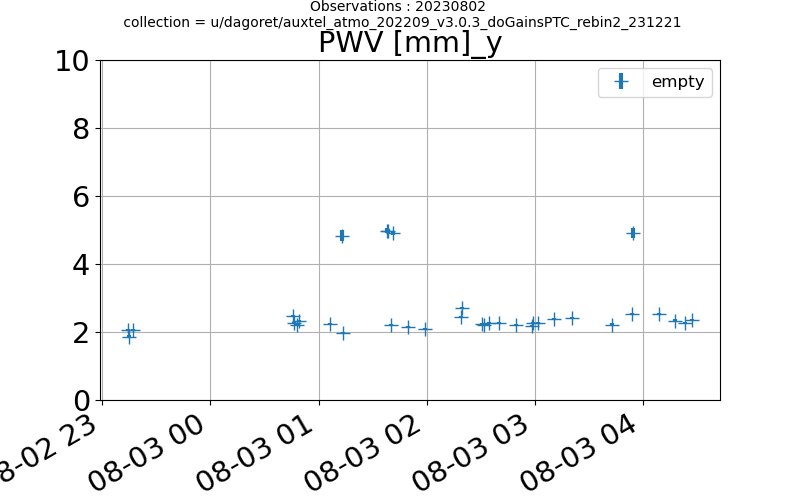

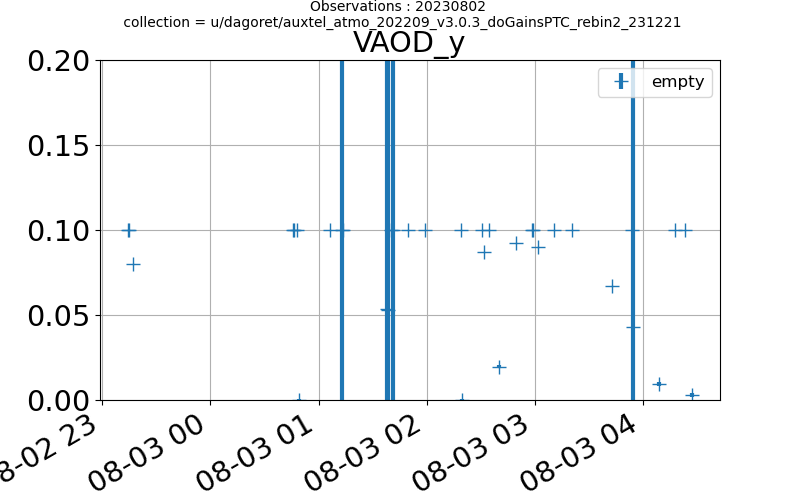

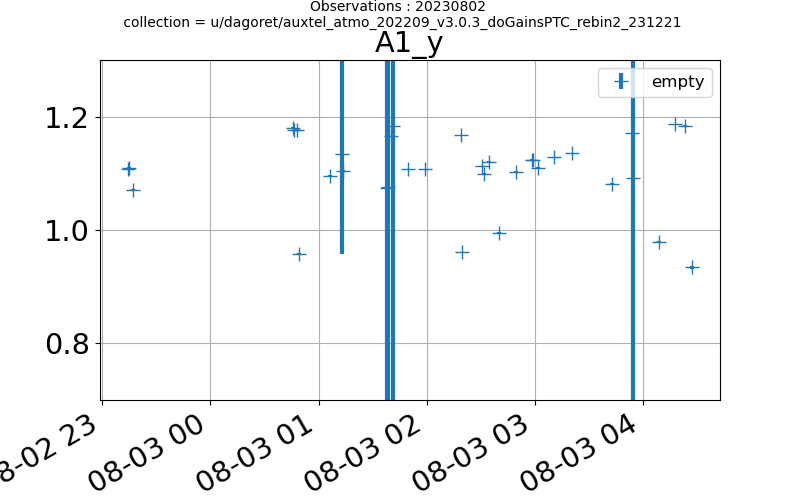

/tmp/ipykernel_27895/770743925.py:17: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))


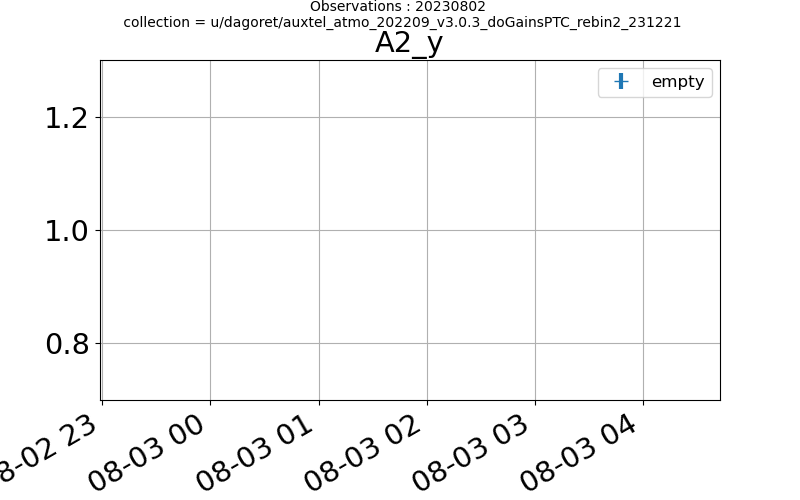

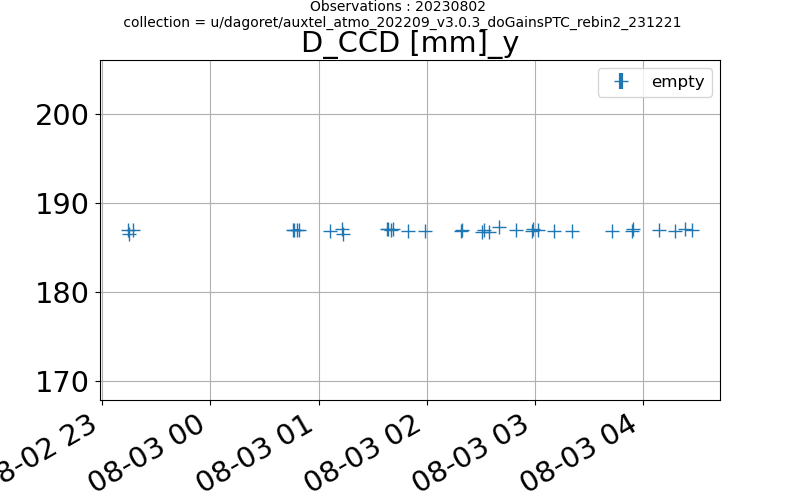

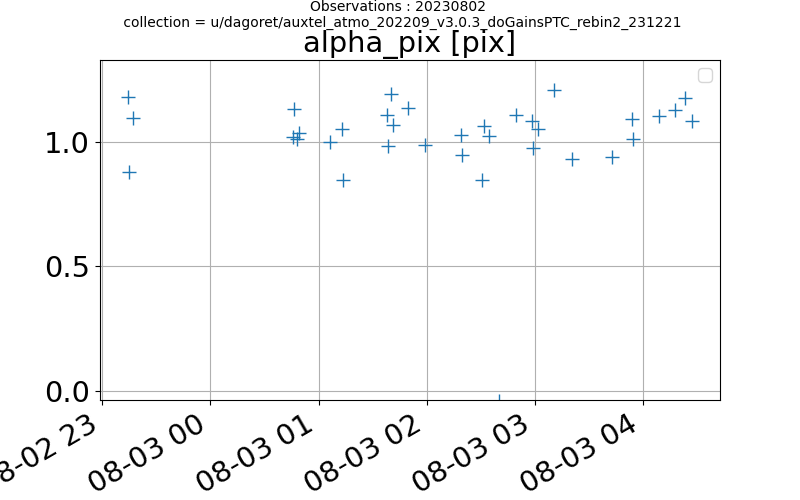

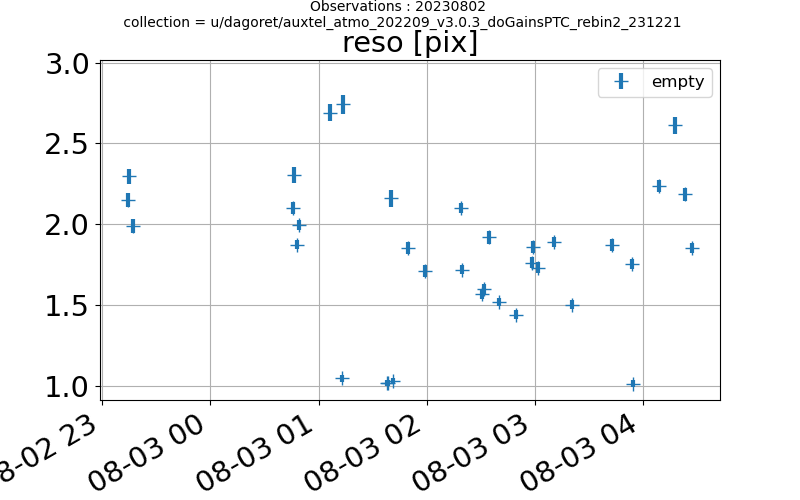

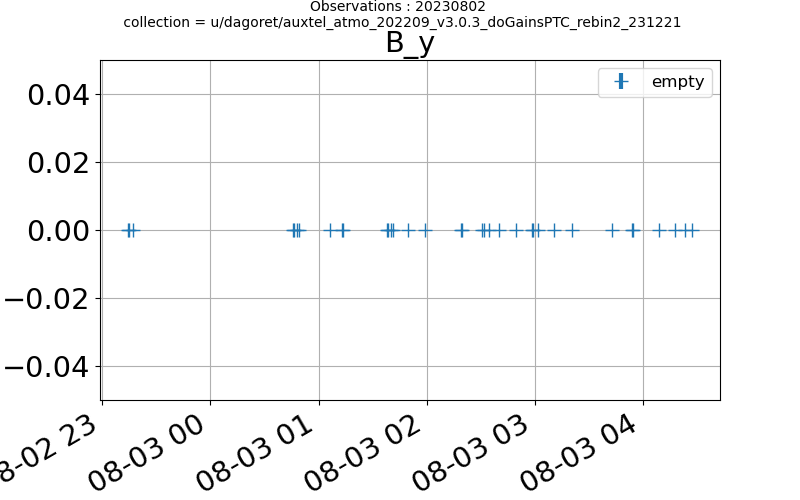

In [40]:
for col in ["A1_y", "chi2_y", "ozone [db]_y", "PWV [mm]_y", "VAOD_y", "A1_y", "A2_y", "D_CCD [mm]_y", "alpha_pix [pix]", "reso [pix]", "B_y"]:
    if col not in df.columns: 
        continue
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for filt in filters:
        if filt in ["HD60753", "HD37962"]:
            continue
        index = filtered & (rec["FILTER"] == filt)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3,label=filt)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
   
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.show()

In [41]:
stars = np.unique(rec["TARGET"])
stars

array(['HD146233', 'HD14943', 'HD185975'], dtype=object)

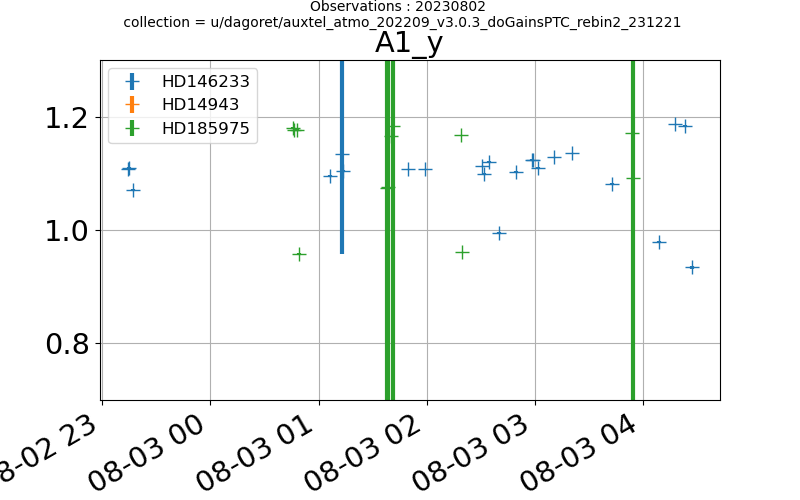

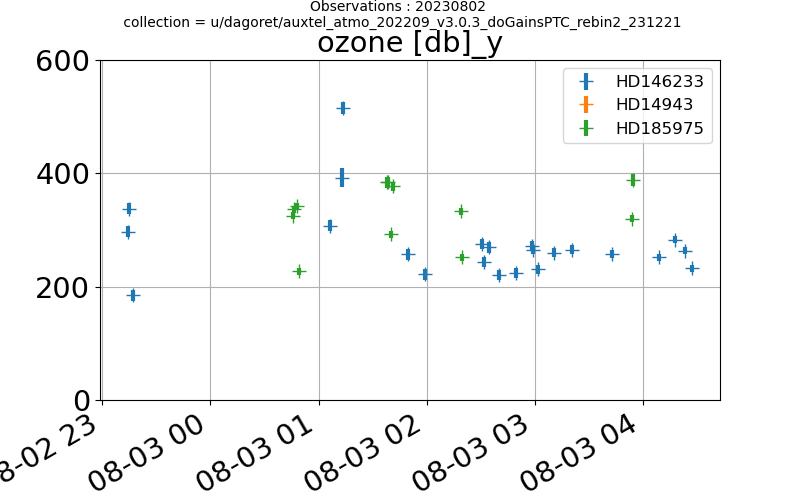

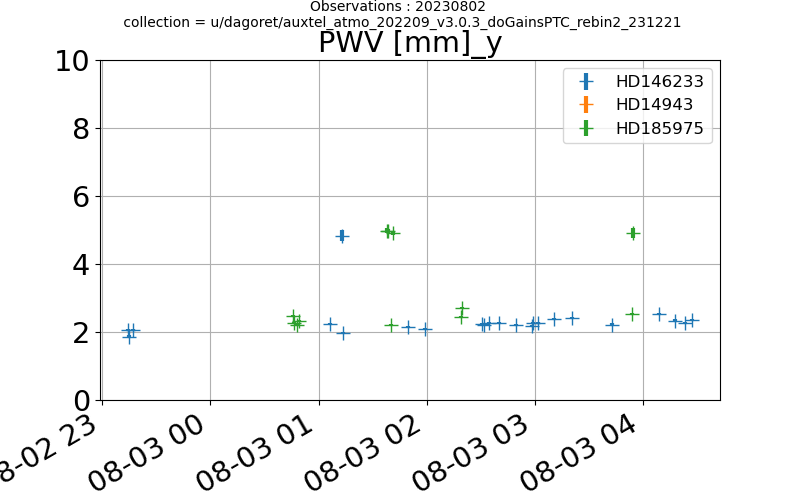

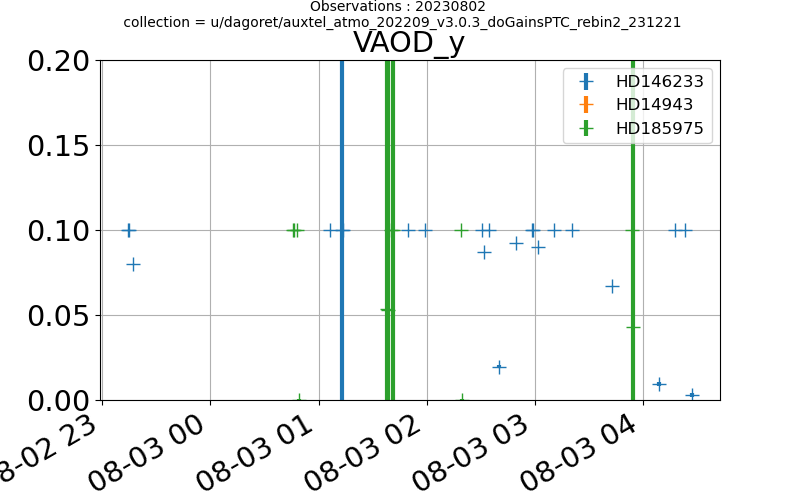

/tmp/ipykernel_27895/146014461.py:17: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))


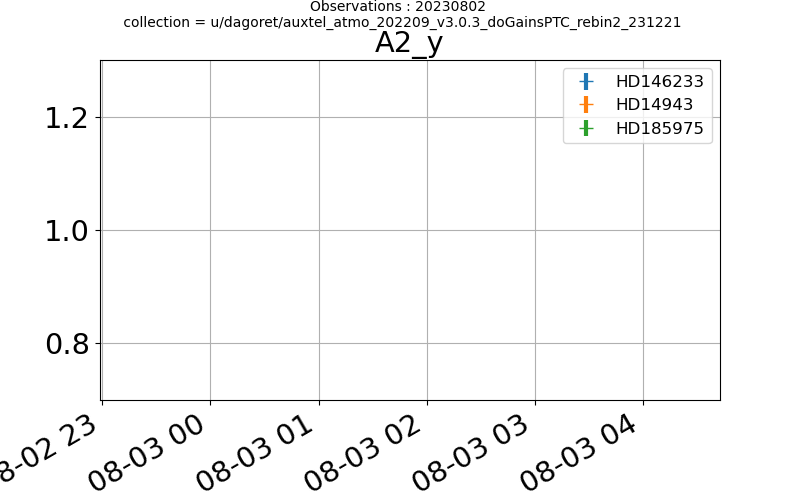

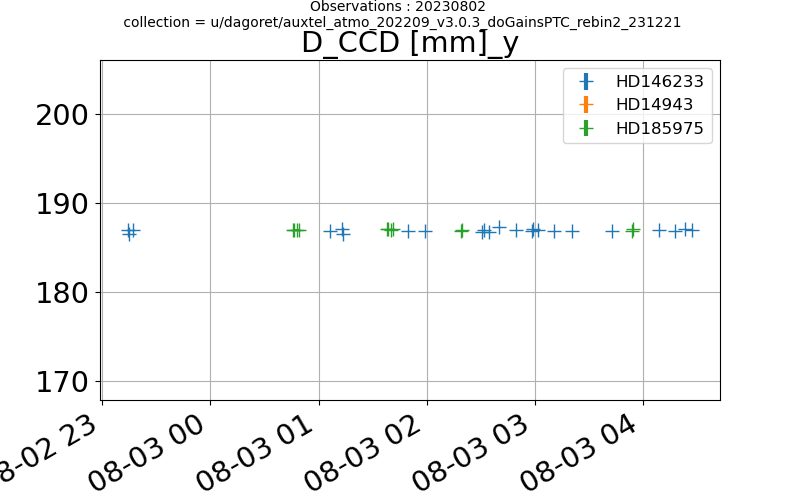

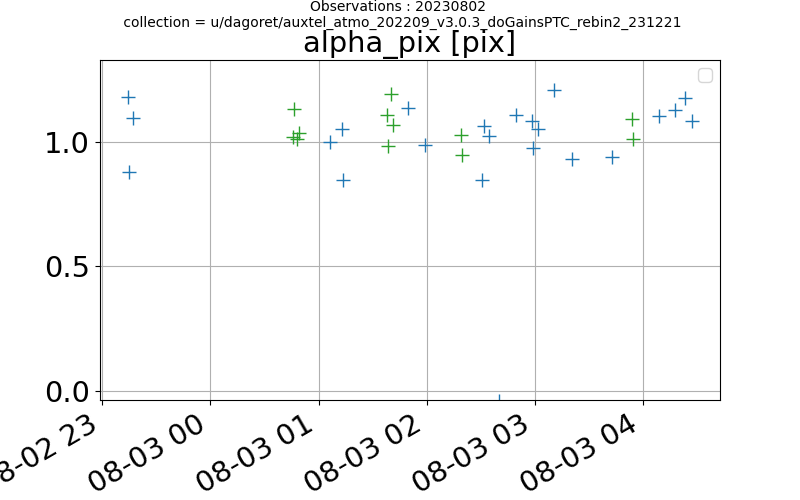

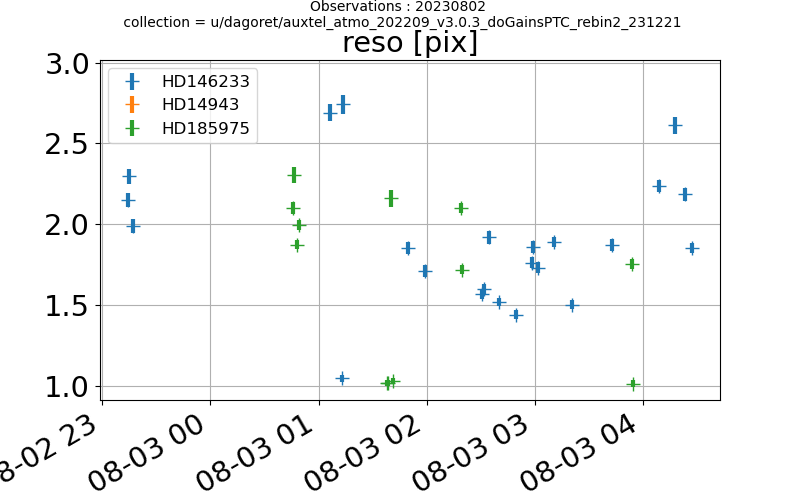

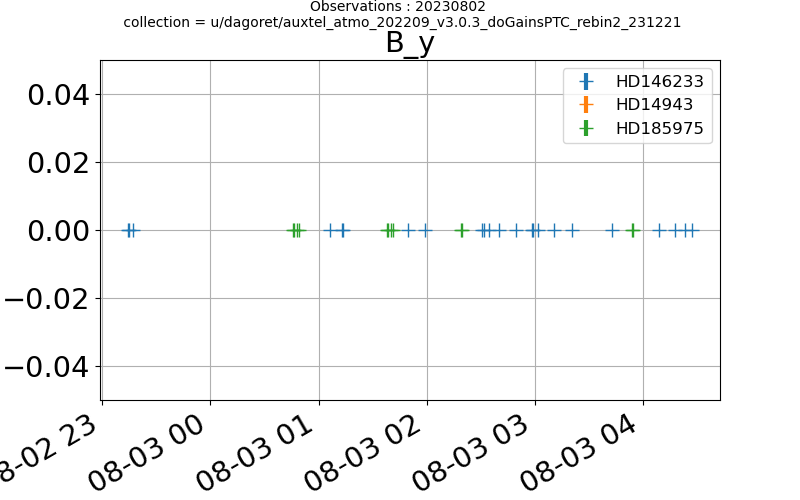

...

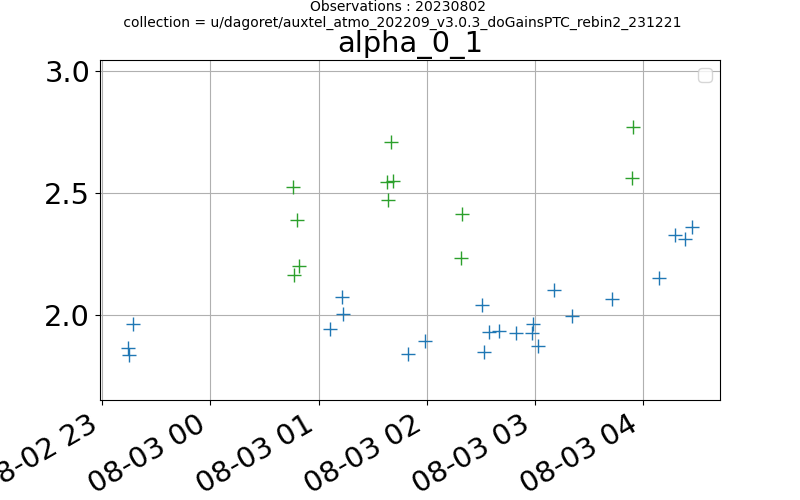

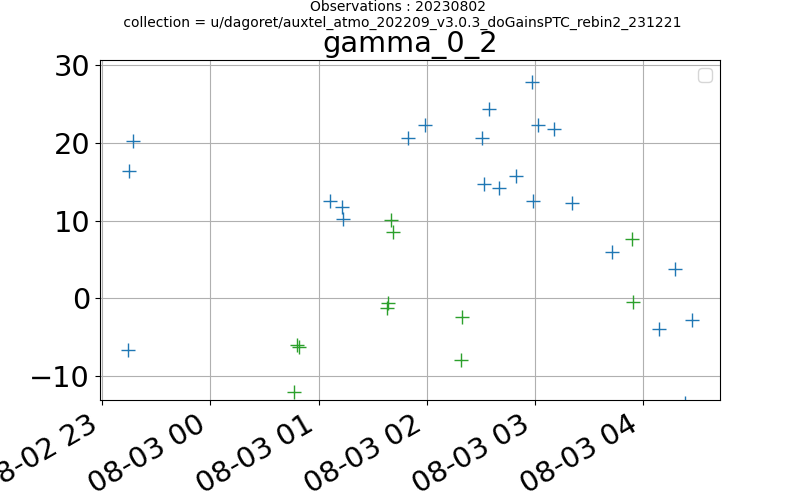

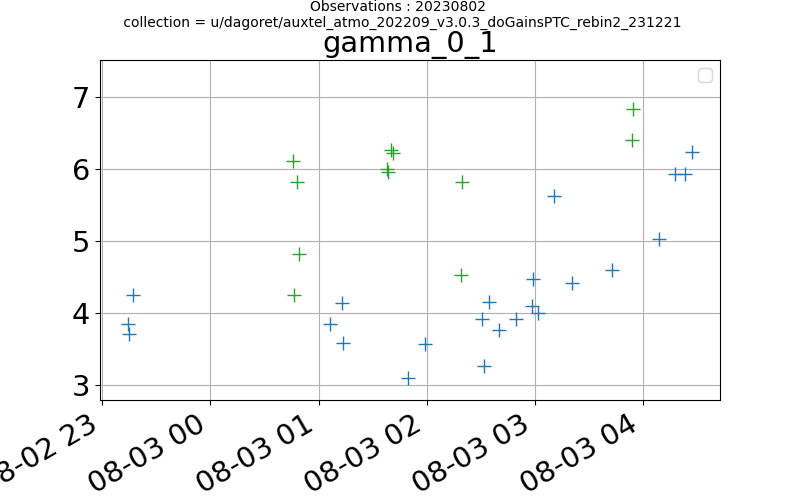

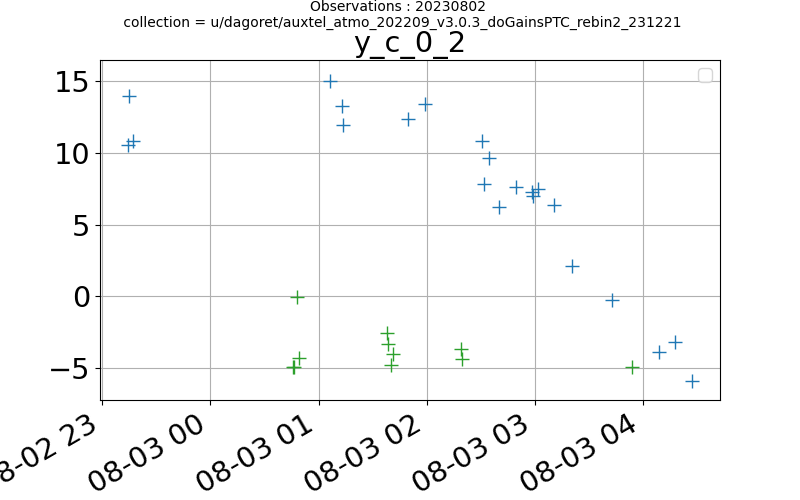

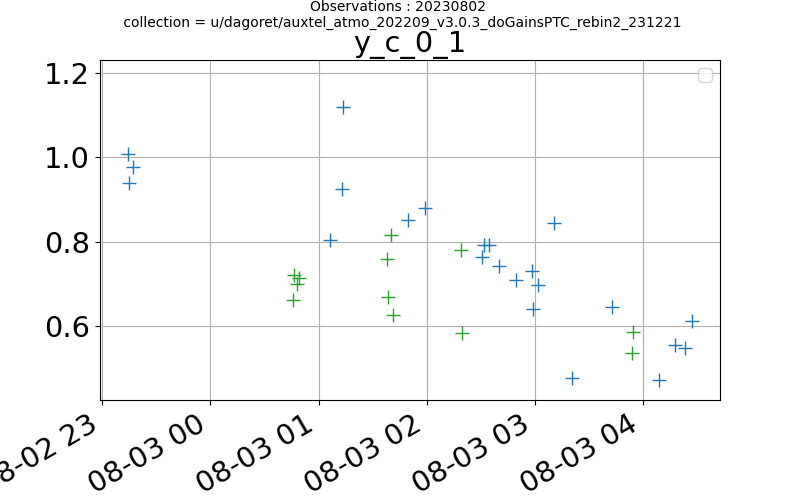

In [42]:
for col in ["A1_y", "chi2_y", "ozone [db]_y", "PWV [mm]_y", "VAOD_y", "A2_y", "D_CCD [mm]_y", "alpha_pix [pix]", "reso [pix]", "B_y", "alpha_0_2", "alpha_0_1", "gamma_0_2", "gamma_0_1", "y_c_0_2", "y_c_0_1"]:
    if col not in df.columns: 
        continue
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for star in stars:
        #if star not in ["HD185975"]:
        #    continue
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3 ,label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.show()

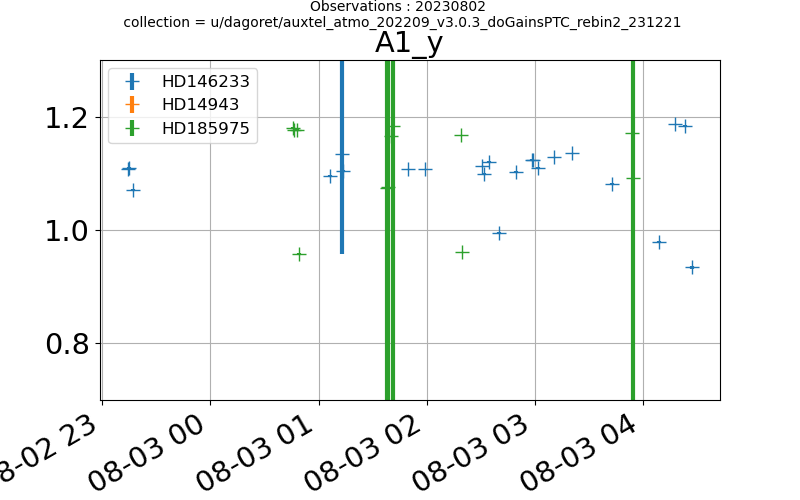

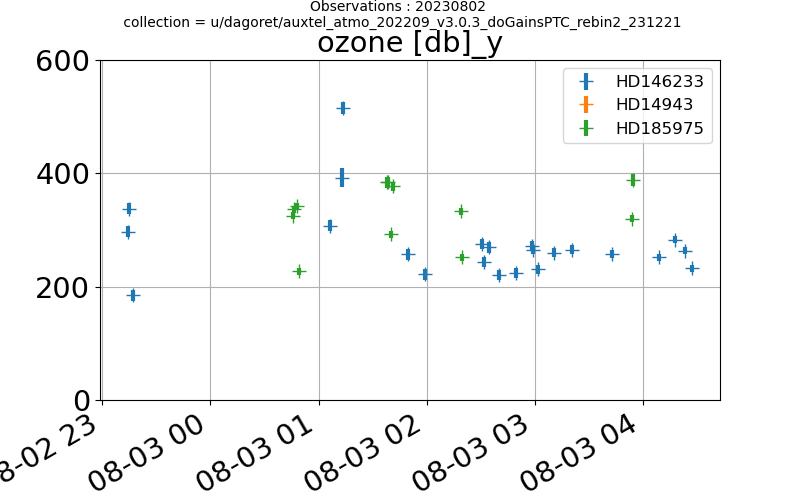

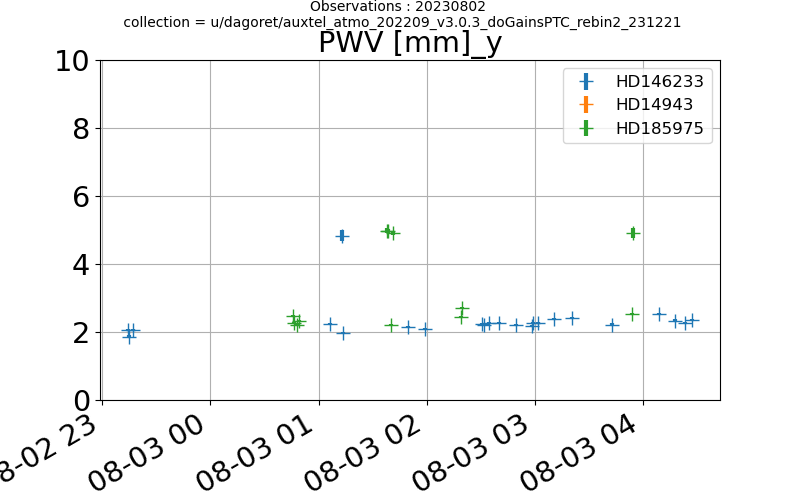

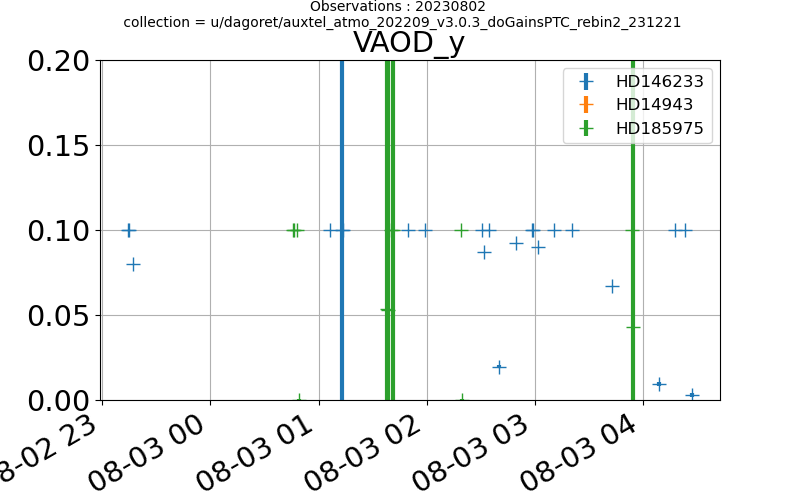

/tmp/ipykernel_27895/2890497810.py:17: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))


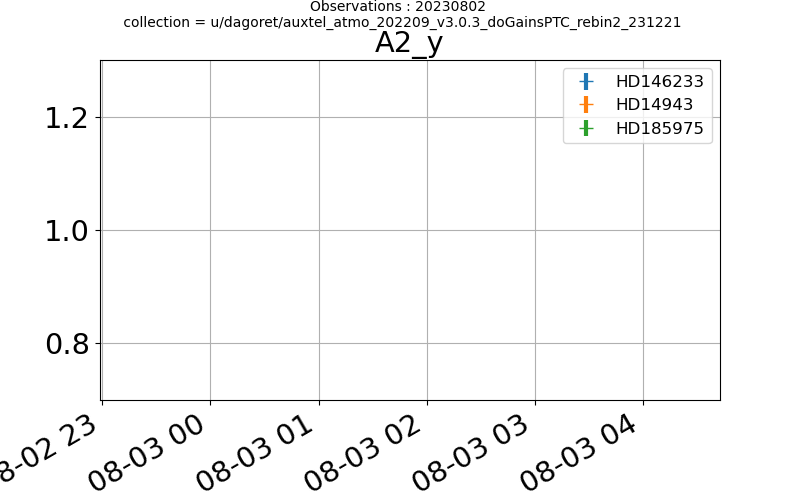

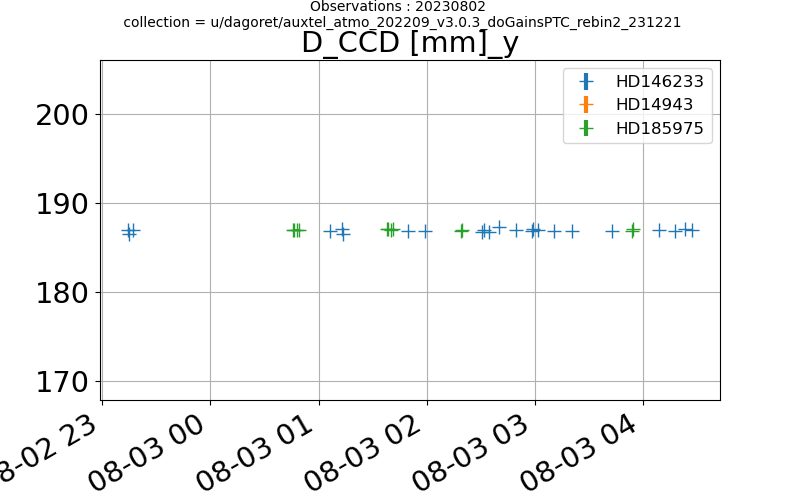

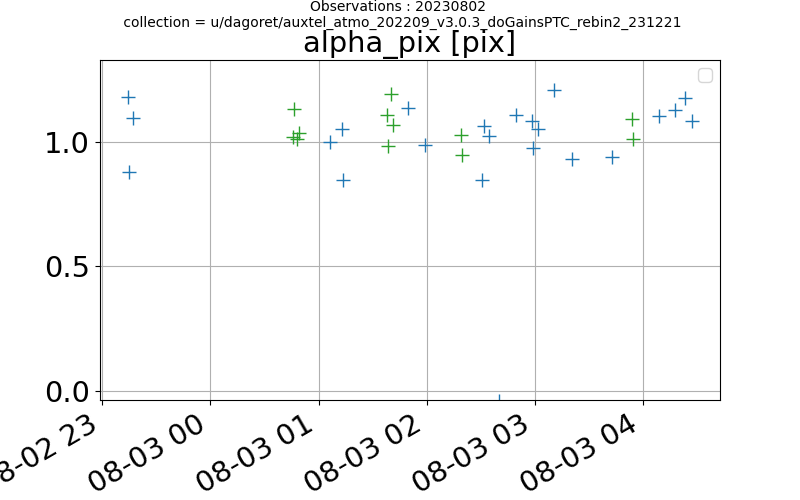

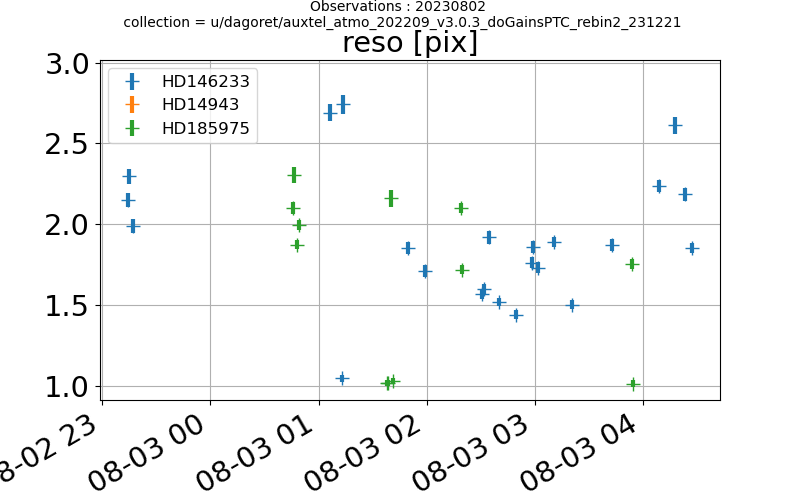

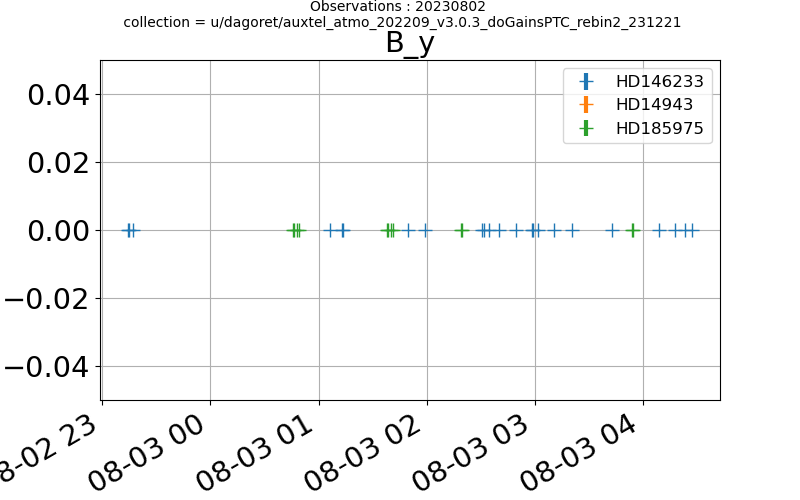

...

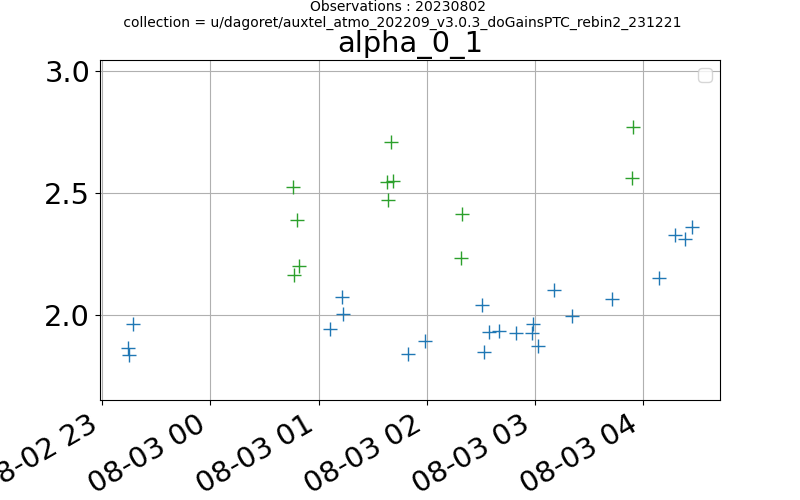

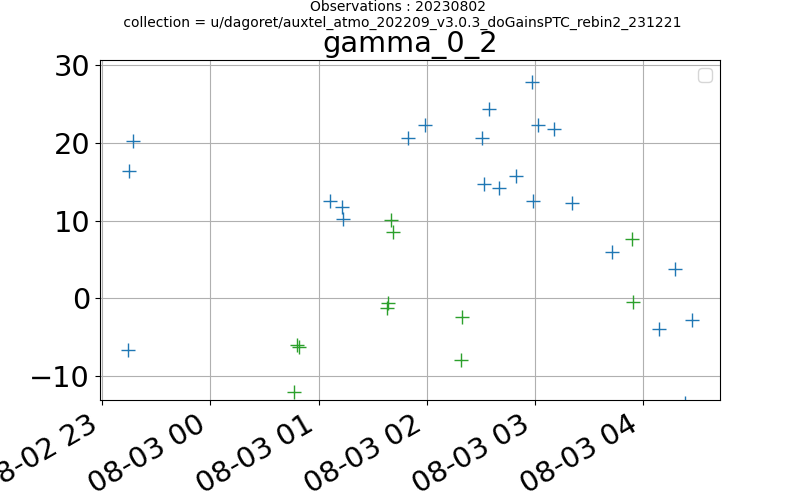

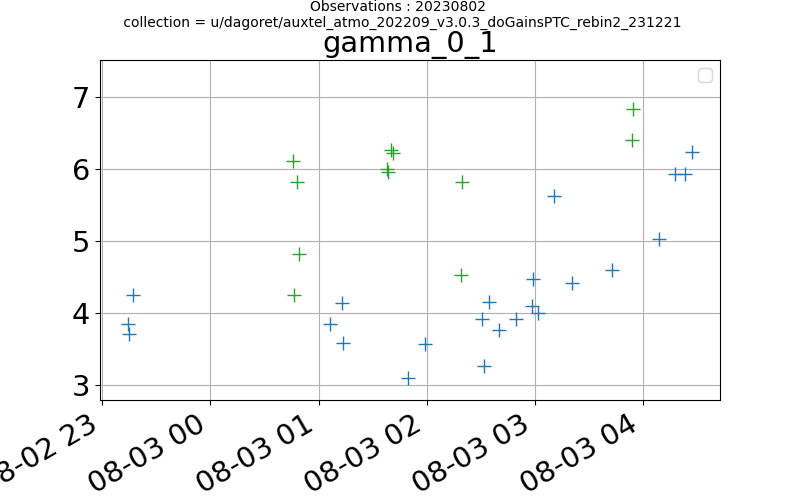

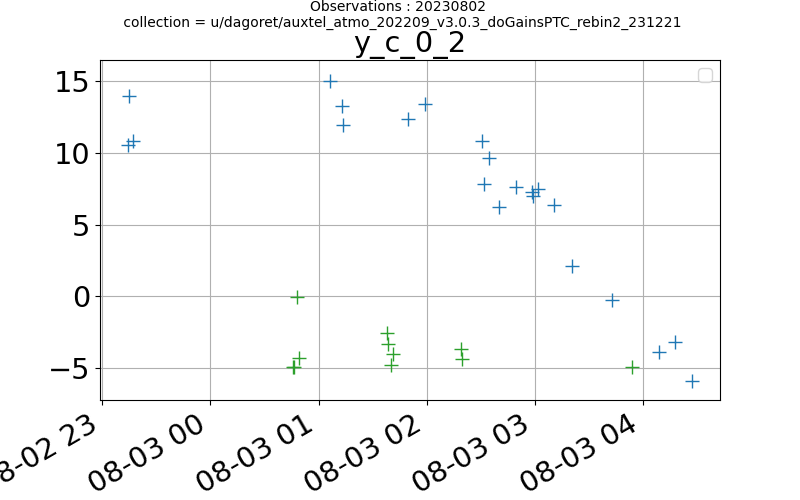

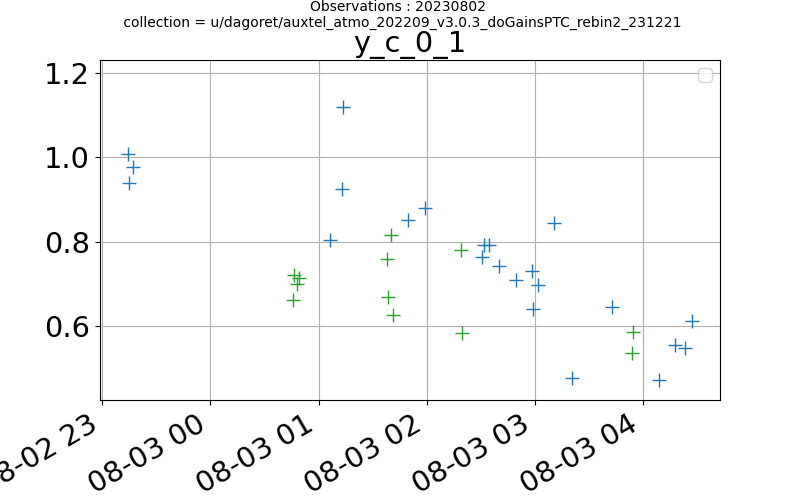

In [43]:
for col in ["A1_y", "chi2_y", "ozone [db]_y", "PWV [mm]_y", "VAOD_y", "A2_y", "D_CCD [mm]_y", "alpha_pix [pix]", "reso [pix]", "B_y", "alpha_0_2", "alpha_0_1", "gamma_0_2", "gamma_0_1", "y_c_0_2", "y_c_0_1"]:
    if col not in df.columns: 
        continue
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for star in stars:
        #if star not in ["HD185975"]:
        #    continue
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3, label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.show()

### Spectrogram forward model fits

In [44]:
filters = np.unique(rec["FILTER"])
filters

array(['empty'], dtype=object)

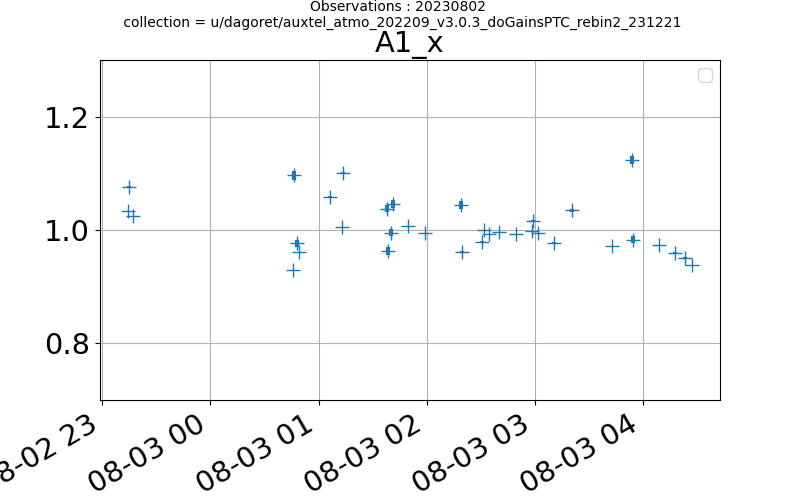

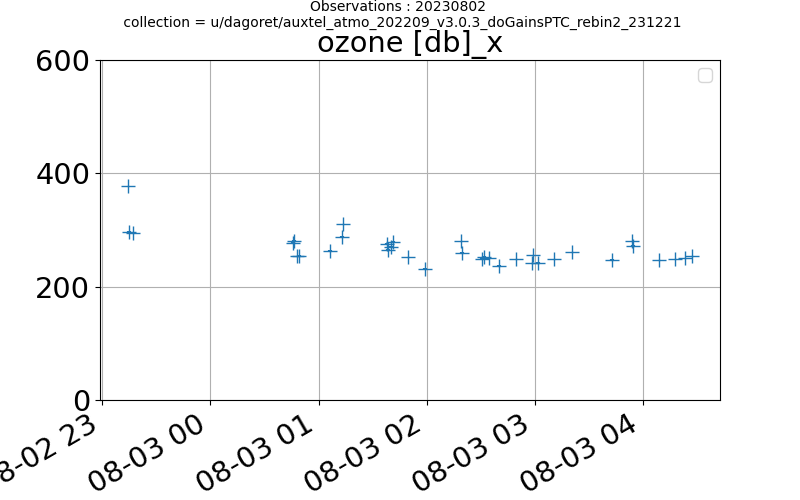

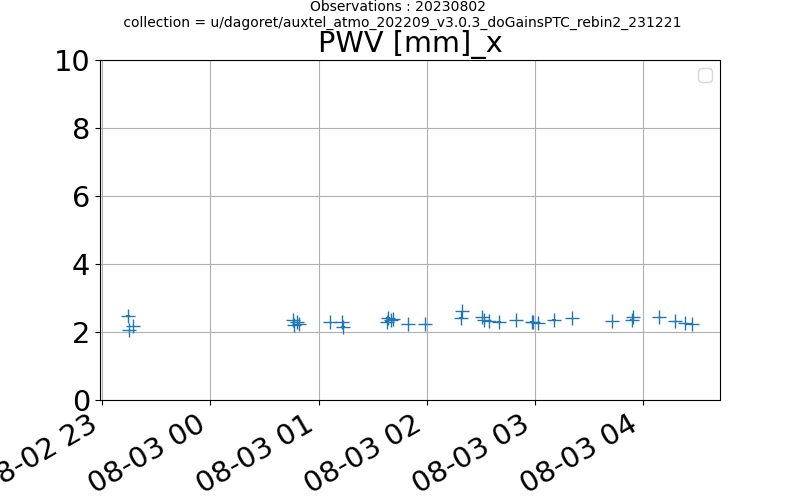

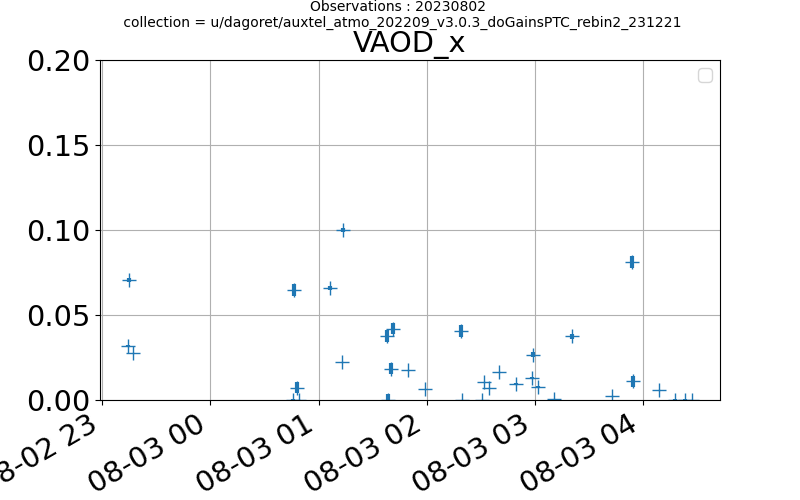

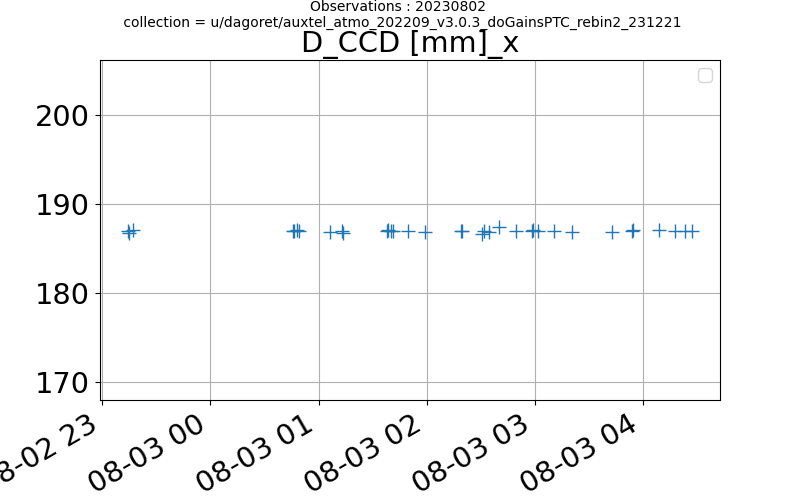

In [45]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x"]: #, "gamma_0", "alpha_0"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for filt in filters:
        index = filtered & (rec["FILTER"] == filt)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend()
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.show()

In [46]:
import matplotlib
matplotlib.pyplot.close()

In [47]:
stars = np.unique(rec["TARGET"])
stars

array(['HD146233', 'HD14943', 'HD185975'], dtype=object)

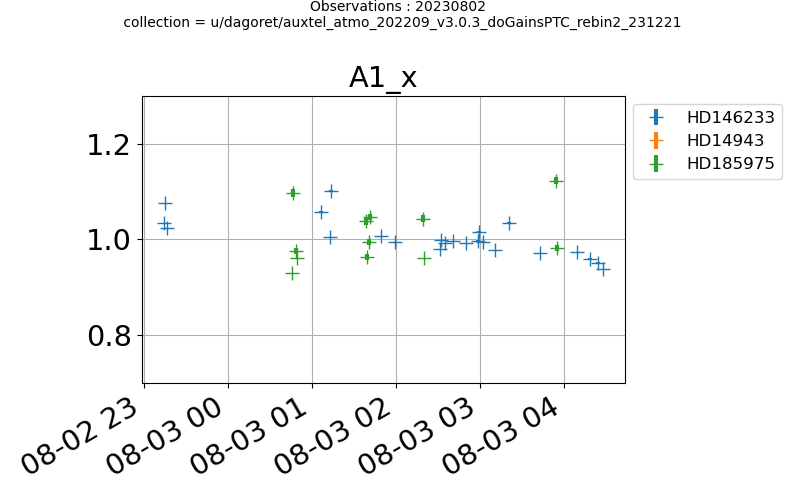

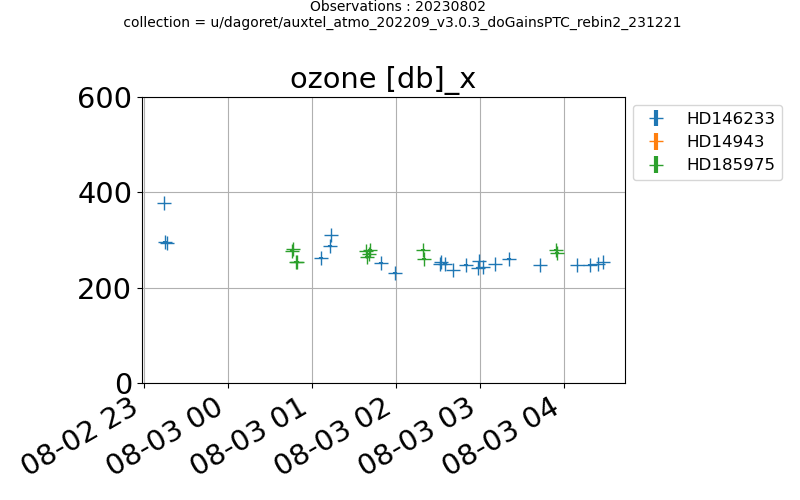

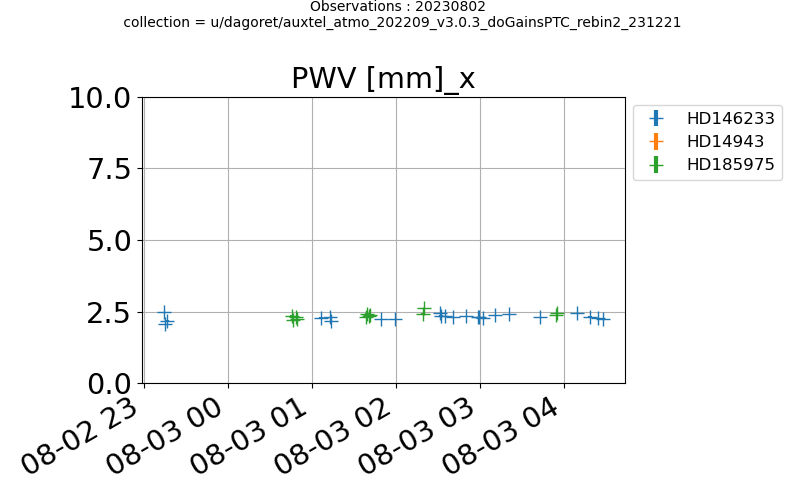

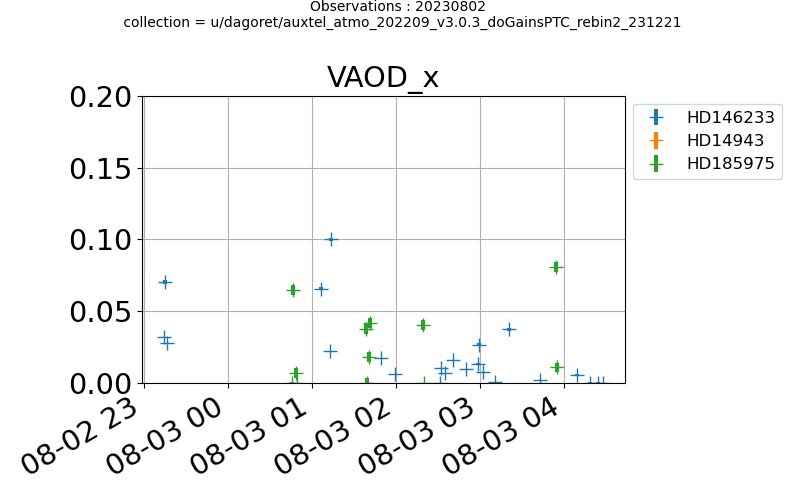

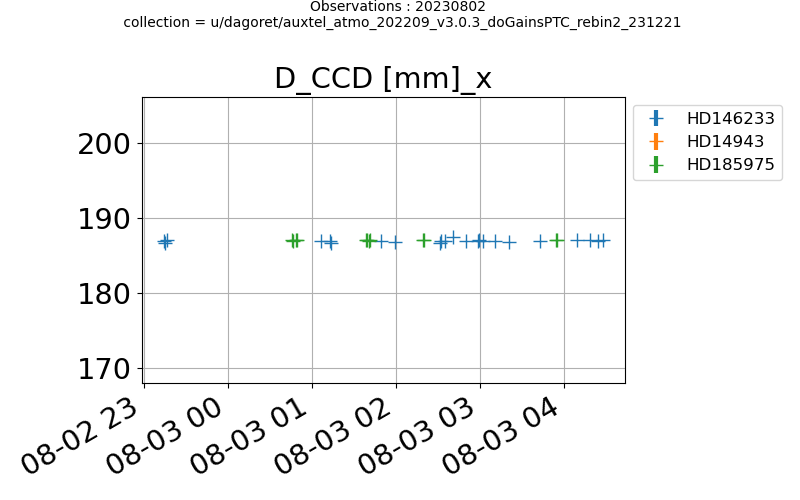

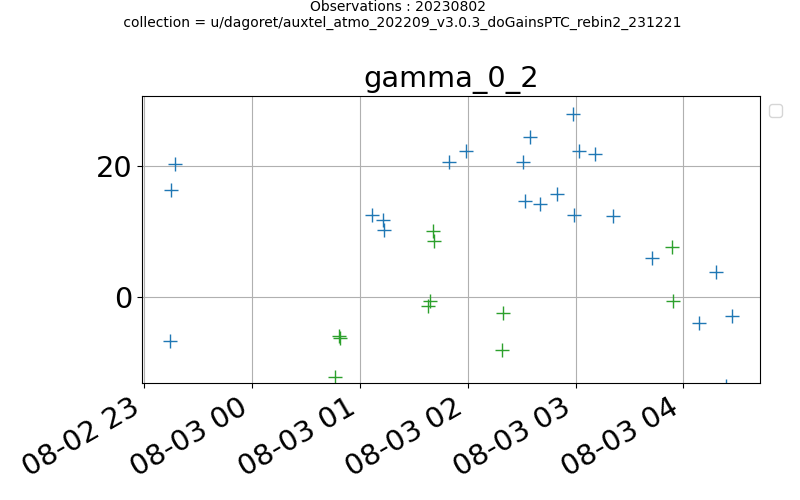

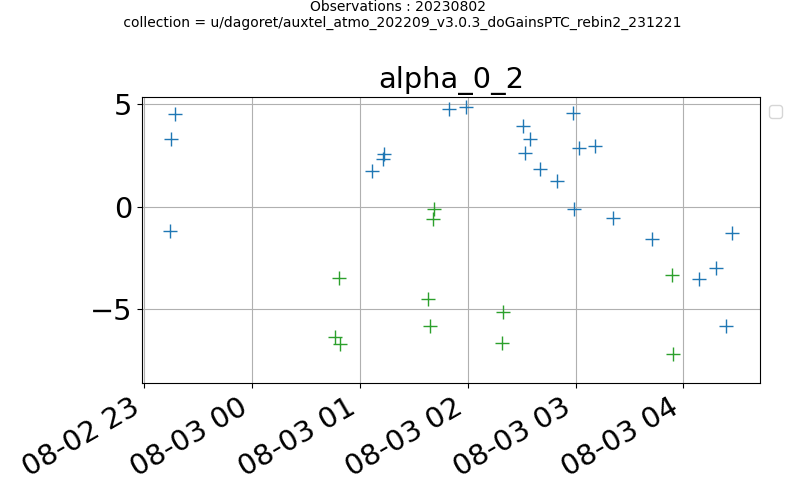

In [48]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x", "gamma_0_2", "alpha_0_2"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for star in stars : #['HD185975']: #stars:
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3 ,label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()

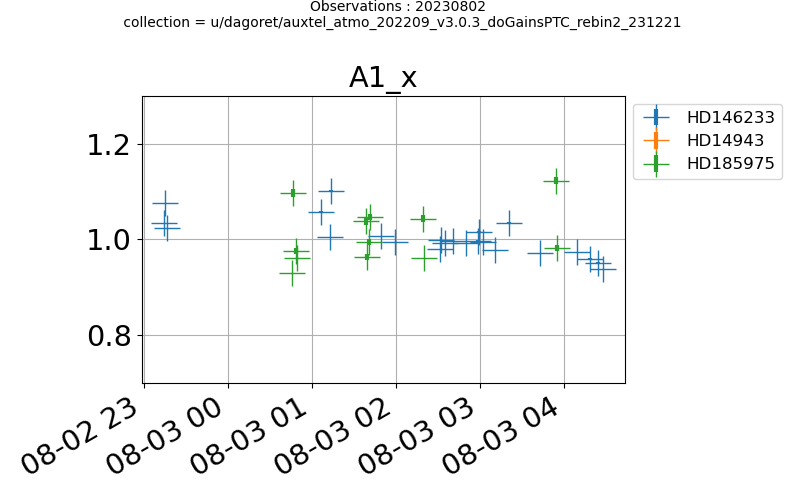

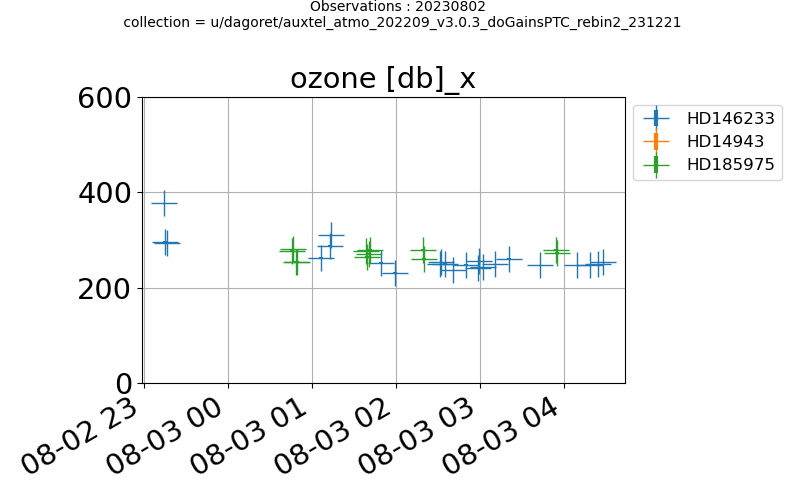

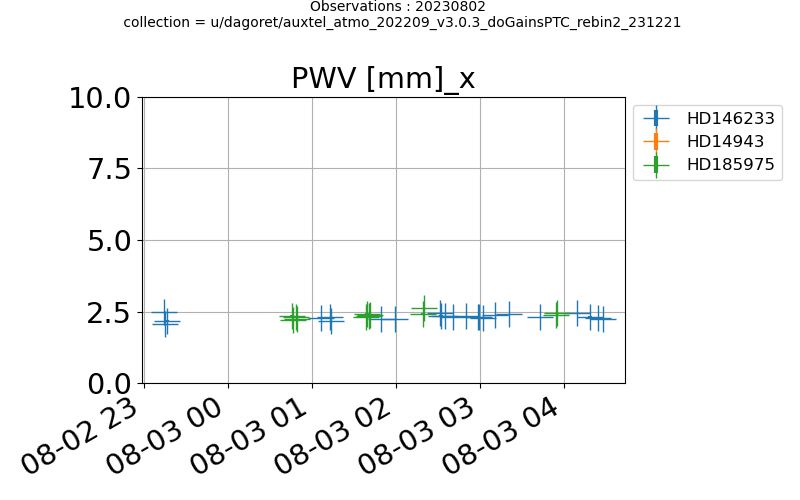

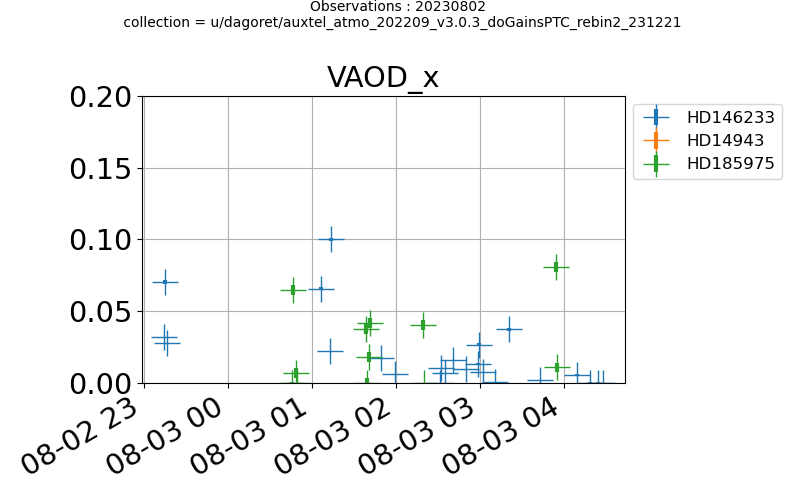

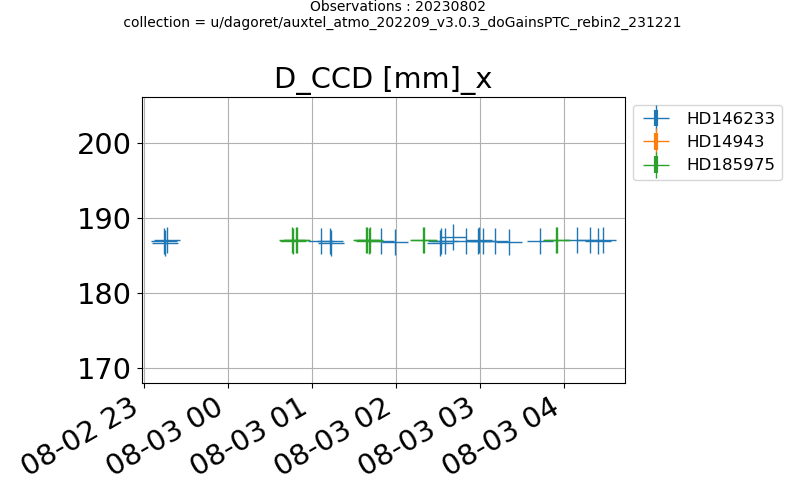

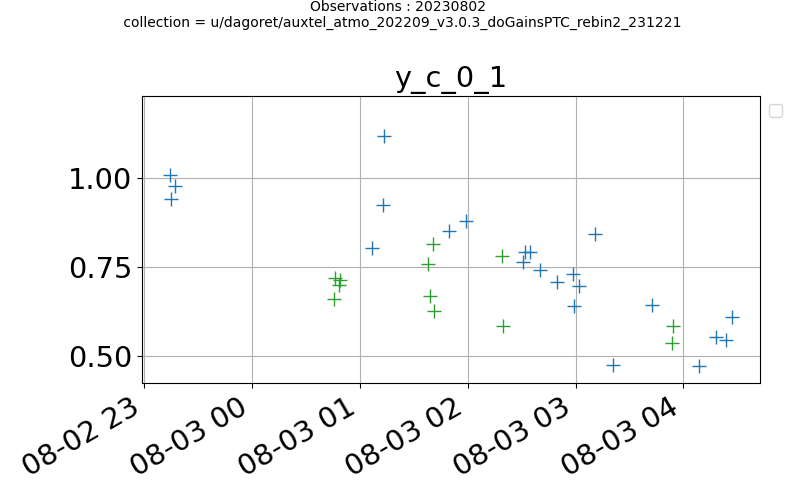

In [49]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x", "y_c_0_1"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for star in stars:
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=19,lw=3 ,label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()

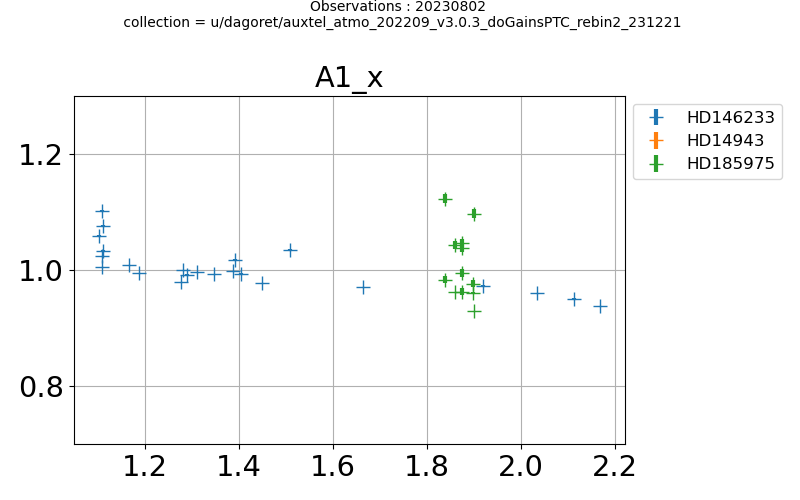

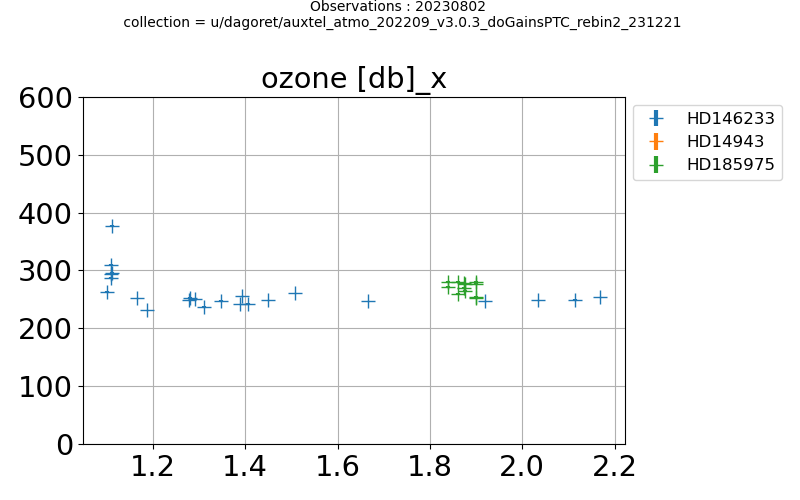

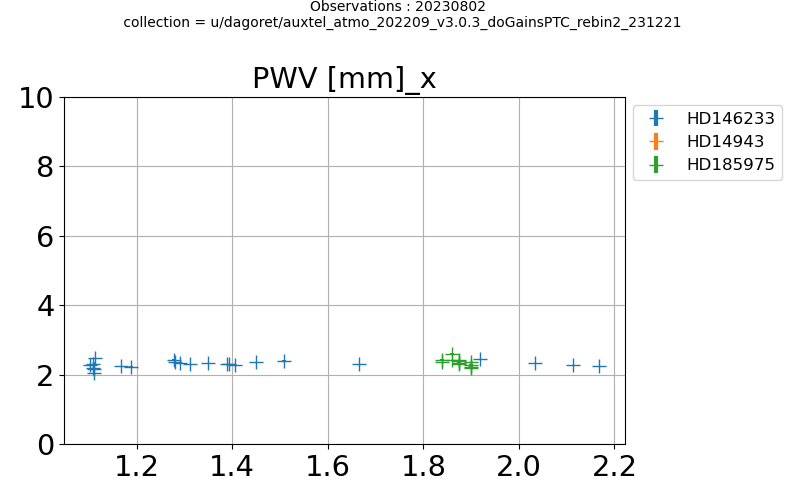

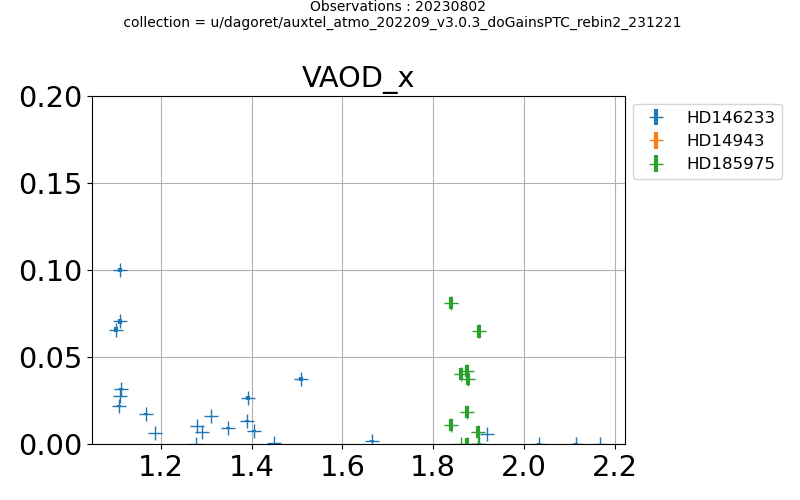

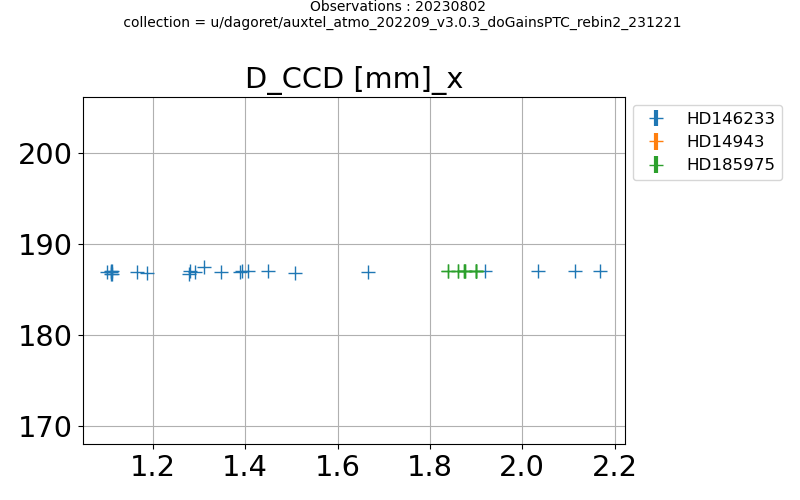

...

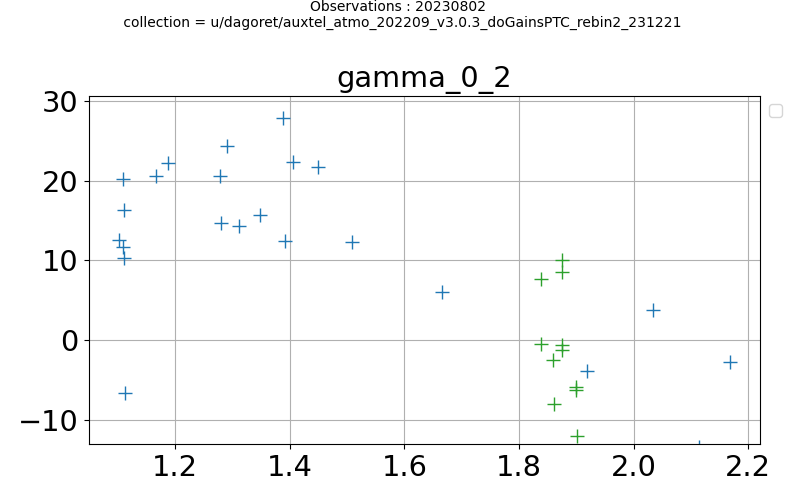

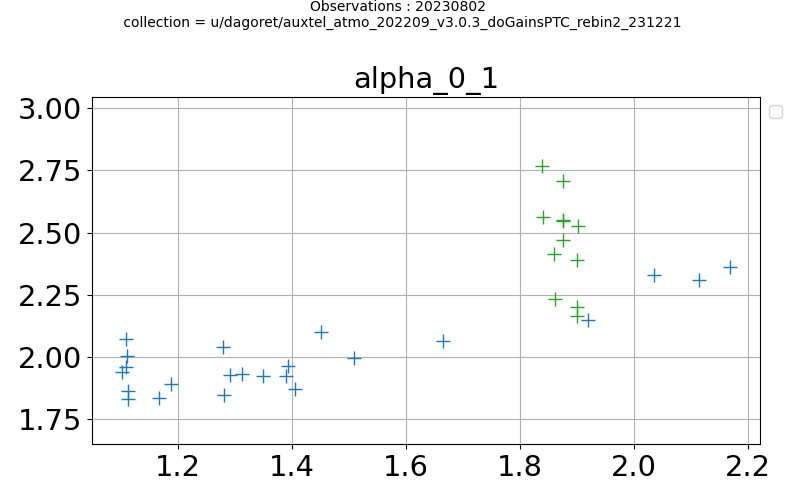

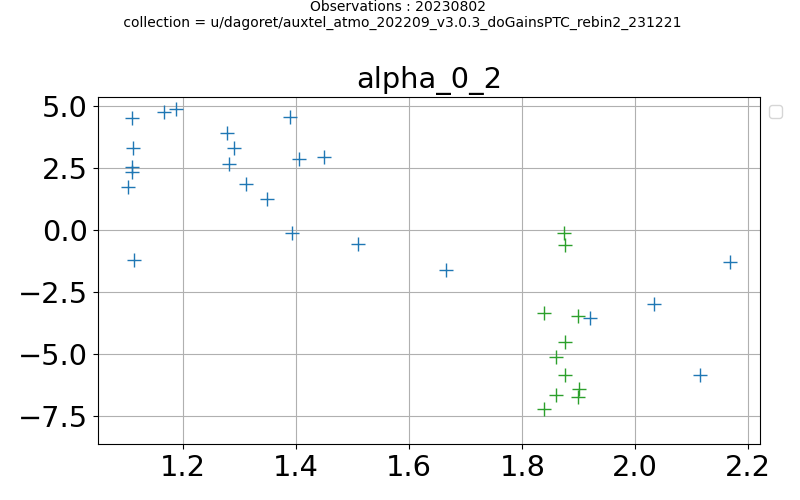

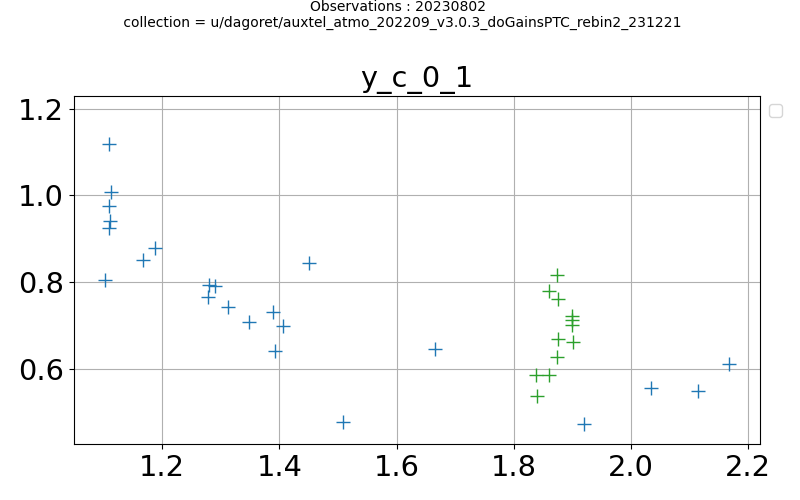

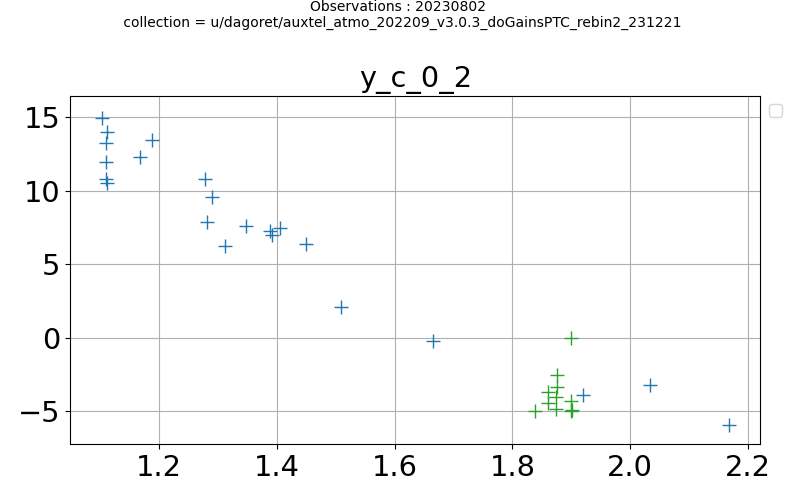

In [50]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x", "gamma_0_1", "gamma_0_2", "alpha_0_1", "alpha_0_2", "y_c_0_1", "y_c_0_2" ]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))
    for star in stars:
        index = filtered & (rec["TARGET"] == star) & (rec["FILTER"]=="empty")
        if col_err in df.columns:
            plt.errorbar(rec["AIRMASS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3 ,label=star)
        else:
            plt.plot(rec["AIRMASS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3 )
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])
    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    #plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()